In [65]:
# %matplotlib notebook

%matplotlib inline

In [70]:
import pandas as pd
import numpy as np
import anndata as ad
import scanpy as sc
import squidpy as sq

from spicemix.io import save_anndata, load_anndata

from synthesize import sample_gaussian, sample_2D_points, synthesize_metagenes
from scipy.stats import gamma, bernoulli, truncnorm
from pathlib import Path

import matplotlib.pyplot as plt
import random
import seaborn as sns

In [67]:
from importlib import reload
import synthesize
reload(synthesize)

<module 'synthesize' from '/work/magroup/shahula/spatiotemporal_transcriptomics_integration/SpiceMixPlus/spicemix/synthesize.py'>

## Simulating spatial patterns

In [4]:
from scipy.spatial import KDTree

class DomainKDTree():
    """Wrapper of KDTree for spatial domain simulation.
    
    """
    
    def __init__(self, landmarks, domain_labels):
        self.kd_tree = KDTree(data=landmarks, copy_data=True)
        self.domain_labels = np.array(domain_labels)
        
    def query(self, coordinates):
        distances, indices = self.kd_tree.query(coordinates)
        return self.domain_labels[indices]

### Using KD tree to create layer-like structure

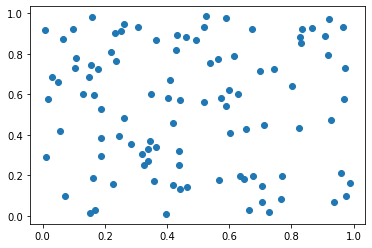

In [5]:
points = sample_2D_points(100, 0.02)
l1 = points[:, 0] < 0.33
l2 = ~l1 & (points[:, 0] < 0.66)
l3 = points[:, 0] > 0.66
plt.scatter(*points.T)

In [6]:
domain_labels = np.zeros(len(points), dtype="<U4")
domain_labels[l1] = "l1"
domain_labels[l2] = "l2"
domain_labels[l3] = "l3"
domain_kd_tree = DomainKDTree(points, domain_labels)

<AxesSubplot:xlabel='x', ylabel='y'>

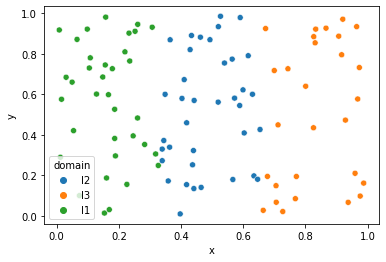

In [7]:
landmark_dataframe = pd.DataFrame(data=points, columns=["x", "y"])
landmark_dataframe["domain"] = domain_labels
sns.scatterplot(data=landmark_dataframe, x="x", y="y", hue="domain")

<AxesSubplot:xlabel='x', ylabel='y'>

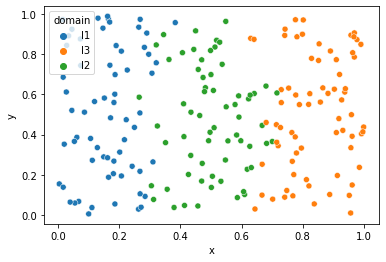

In [8]:
test_coordinates = sample_2D_points(200, 0.01)
queried_labels = domain_kd_tree.query(test_coordinates)
test_dataframe = pd.DataFrame(data=test_coordinates, columns=["x", "y"])
test_dataframe["domain"] = queried_labels
sns.scatterplot(data=test_dataframe, x="x", y="y", hue="domain")

### Simulating Visium

In [44]:
visium = sq.datasets.visium_hne_adata("../../data/visium/hne.h5ad")

In [45]:
slideseqv2 = sq.datasets.slideseqv2("../../data/slideseqv2/slideseqv2.h5ad")

In [46]:
visium

AnnData object with n_obs × n_vars = 2688 × 18078
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden', 'cluster'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'cluster_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'spatial', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

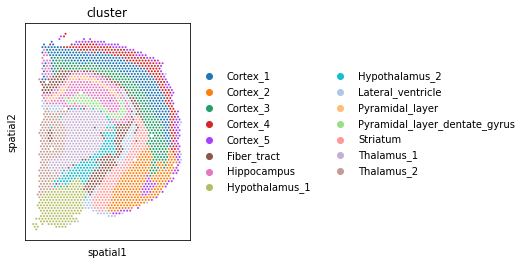

In [47]:
fig, ax = plt.subplots()

sc.pl.spatial(visium, color="cluster", img_key=None, ax=ax)

In [48]:
landmarks = visium.obsm["spatial"]
labels = visium.obs["cluster"]

dimensions = landmarks.ptp(axis=0)
lower_boundaries = landmarks.min(axis=0)
test_coordinates = sample_2D_points(5000, 0.01)

scaled_coordinates = test_coordinates * dimensions.T + lower_boundaries

visium_kd_tree = DomainKDTree(landmarks, labels)

/tmp/ipykernel_187236/134837841.py:3: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  test_dataframe = ad.AnnData(X=test_coordinates)


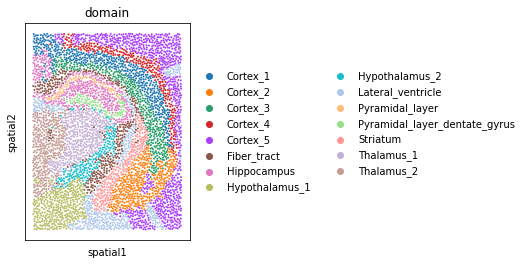

In [49]:
queried_labels = visium_kd_tree.query(scaled_coordinates)

test_dataframe = ad.AnnData(X=test_coordinates)
test_dataframe.obsm["spatial"] = scaled_coordinates
test_dataframe.obs["domain"] = queried_labels
test_dataframe.uns["spatial"] = visium.uns["spatial"]
sc.pl.spatial(test_dataframe, color="domain", img_key=None)

## Using ipycanvas to annotate spatial domains

Installation is not that simple, but see below:

In [9]:

!jupyter nbextension install --py --symlink --sys-prefix ipycanvas --user
!jupyter nbextension enable --py ipycanvas

Installing /home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/ipycanvas/nbextension/static -> ipycanvas
cannot specify more than one of user, sys_prefix, prefix, or nbextensions_dir, but got: user=True, sys_prefix=True
Enabling notebook extension ipycanvas/extension...
      - Validating: OK


In [10]:
from ipycanvas import Canvas, hold_canvas
from ipywidgets import Output
import numpy as np

In [11]:
# Test
n_particles = 100_000

x = np.array(np.random.rayleigh(250, n_particles), dtype=np.int32)
y = np.array(np.random.rayleigh(250, n_particles), dtype=np.int32)
size = np.random.randint(1, 3, n_particles)

width = 800
height = 500
canvas = Canvas(width=width, height=height)

canvas.layout.width = f"{width // 16}px"
canvas.layout.height = f"{height // 16}px"
    
canvas.fill_style = "green"
canvas.fill_rects(x, y, size)

canvas

Canvas(layout=Layout(height='31px', width='50px'), width=800)

In [53]:
landmarks = visium.obsm["spatial"]
labels = visium.obs["cluster"]

dimensions = landmarks.ptp(axis=0)
lower_boundaries = landmarks.min(axis=0)
test_coordinates = sample_2D_points(5000, 0.01)

scaled_coordinates = test_coordinates * dimensions.T + lower_boundaries

visium_kd_tree = DomainKDTree(landmarks, labels)

/tmp/ipykernel_187236/134837841.py:3: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  test_dataframe = ad.AnnData(X=test_coordinates)


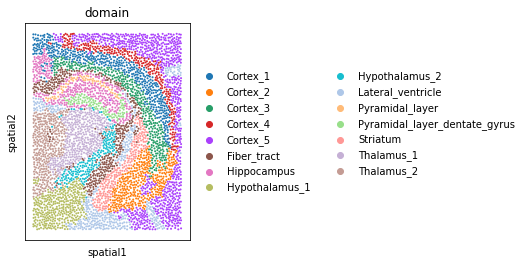

In [54]:
queried_labels = visium_kd_tree.query(scaled_coordinates)

test_dataframe = ad.AnnData(X=test_coordinates)
test_dataframe.obsm["spatial"] = scaled_coordinates
test_dataframe.obs["domain"] = queried_labels
test_dataframe.uns["spatial"] = visium.uns["spatial"]
sc.pl.spatial(test_dataframe, color="domain", img_key=None)

In [12]:
from ipycanvas import Canvas, hold_canvas
from ipywidgets import Output
from collections import defaultdict

class DomainCanvas():
    """Annotate spatial domains on a reference ST dataset and use to define domains for simulations.
    
    """
    
    def __init__(self, points, domain_names, canvas_width=400, density=10):
        """Constructor
        
        Args:
            points (nd.array): background points to use as reference for domain annotation
            domain_names (list of str): list of domains that will be annotated
            canvas_width (int): display width of canvas in Jupyter Notebook, in pixels
            density (float): Try 1 for Visium and 4 for Slide-seq V2
            
        """
        self.points = points
        self.domain_names = domain_names
        self.domain_option_string = "\n".join(f"{index}: {domain}" for index, domain in enumerate(self.domain_names))
        self.domain_deletion_string = \
            "This domain has already been annotated. What would you like to do? (enter 0 or 1) \n" \
            "0: Further annotate it\n" \
            "1: Delete the existing annotation and start from scratch\n"       
        
        dimensions = self.points.ptp(axis=0)
        lower_boundaries = self.points.min(axis=0)
        self.width, self.height = dimensions + lower_boundaries
 
        self.canvas_width = canvas_width
        self.canvas_height = int((self.height / self.width) * self.canvas_width)

        self.scaling_factor = self.canvas_width / self.width
        
        self.canvas = Canvas(width=self.width * self.scaling_factor, height=self.height * self.scaling_factor)

        self.canvas.layout.width = f"{self.canvas_width}px"
        self.canvas.layout.height = f"{self.canvas_height}px"
        
        self.density = density
        self.radius = 6 / self.density       
        self.canvas.line_width = 2.5 / self.density
        
        self.render_reference_points()
        
        self.domains = defaultdict(list)
        self.colors = {}
        self.out = self.bind_canvas()
        
        return
    
    def render_reference_points(self):
        x, y = self.points.T * self.scaling_factor

        self.canvas.stroke_style = "gray"
        self.canvas.stroke_circles(x, y, self.radius)
        
    def redraw(self):
        self.canvas.clear()
        self.render_reference_points()
        self.load_domains(self.domains)
        
    def bind_canvas(self):
        """Bind mouse click to canvas.
        
        Only used during initialization.
        """
        out = Output()

        @out.capture()
        def handle_mouse_down(x, y):
            with hold_canvas():
                self.canvas.sync_image_data=True
                self.canvas.stroke_circle(x, y, self.radius)
                self.canvas.fill_circle(x, y, self.radius)
                self.canvas.stroke()
                self.canvas.fill()
                self.canvas.sync_image_data=False
                
            self.domains[self.current_domain].append((x / self.scaling_factor, y / self.scaling_factor))
            return

        self.canvas.on_mouse_down(handle_mouse_down)
        
        return out

    def display(self):
        """Display editable canvas.
        
        Click to add landmarks for the domain self.current_domain.
        
        """
        display(self.out)
        return self.canvas
    
    def annotate_domain(self):
        """Create a new domain and display the canvas for annotation.
        
        """
        domain_index = int(input(
            "Choose a domain to annotate (enter an integer):\n"
            f"{self.domain_option_string}\n"
        ))
        if not (0 <= domain_index < len(self.domain_names)):
            raise ValueError(f"`{domain_index}` is not a valid index.")
                                              
        self.current_domain = self.domain_names[domain_index]
        
        if self.current_domain in self.colors:
            start_afresh = int(input(self.domain_deletion_string))
            if start_afresh not in (0, 1):
                raise ValueError(f"`{start_afresh}` is not a valid option.")
                
            if start_afresh:
                del self.domains[self.current_domain]
                self.redraw()
                
            color = self.colors[self.current_domain]

        else:
            r, g, b = np.random.randint(0, 255, size=3)
            color = f"rgb({r}, {g}, {b})"
            self.colors[self.current_domain] = color
            
        self.canvas.stroke_style = color
        self.canvas.fill_style = color
        
        return self.display()
    
    def load_domains(self, domains):
        """Load and display a pre-defined set of domains.
        
        """

        for domain_name in domains:
            self.domains[domain_name] = domains[domain_name]
            coordinates = domains[domain_name]
            
            if domain_name in self.colors:
                color = self.colors[domain_name]
            else:
                r, g, b = np.random.randint(0, 255, size=3)
                color = f"rgb({r}, {g}, {b})"
                self.colors[domain_name] = color

            self.canvas.stroke_style = color
            self.canvas.fill_style = color
            
            x, y = np.array(coordinates).T * self.scaling_factor
            self.canvas.stroke_circles(x, y, self.radius)
            self.canvas.fill_circles(x, y, self.radius)
    
    def generate_domain_kd_tree(self):
        """Export annotated dataset to KD-tree.
        
        """
        domains, coordinates = zip(*self.domains.items())

        domain_labels = [[domain] * len(coordinate) for domain, coordinate in zip(domains, coordinates)]

        flattened_domain_labels = np.concatenate(domain_labels)
        flattened_coordinates = np.concatenate(coordinates)
        annotated_domain_kd_tree = DomainKDTree(flattened_coordinates, flattened_domain_labels)
        
        return annotated_domain_kd_tree

### Example with Visium data

In [7]:
points = visium.obsm["spatial"]
lower_boundaries = points.min(axis=0)
points -= lower_boundaries

domain_names = ["L1", "L2"]
domain_canvas = DomainCanvas(points, domain_names, canvas_width=600, density=1)

NameError: name 'visium' is not defined

In [8]:
domain_canvas.annotate_domain()

NameError: name 'domain_canvas' is not defined

In [272]:
annotated_domains_kd_tree = domain_canvas.generate_domain_kd_tree()

In [152]:
dimensions = domain_canvas.points.ptp(axis=0)
test_coordinates = sample_2D_points(5000, 0.01)
scaled_coordinates = test_coordinates * dimensions.T

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  This is separate from the ipykernel package so we can avoid doing imports until


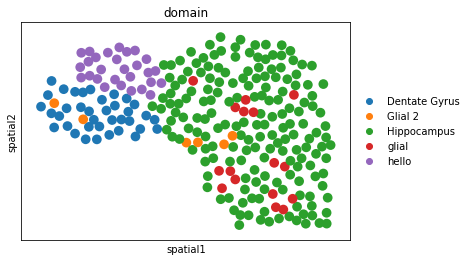

In [153]:
queried_labels = annotated_domains_kd_tree.query(scaled_coordinates)

test_dataframe = ad.AnnData(X=test_coordinates)
test_dataframe.obsm["spatial"] = scaled_coordinates
test_dataframe.obs["domain"] = queried_labels
test_dataframe = test_dataframe[test_dataframe.obs["domain"] != "N/A"]
test_dataframe.uns["spatial"] = visium.uns["spatial"]
sc.pl.spatial(test_dataframe, color="domain", img_key=None)

## Simulating expression

In [13]:
def synthesize_average_expressions(num_genes, cell_type_variation_probabilities, shape_parameter, normalize=True):
    """Synthesize related metagenes according to the metagene_variation_probabilities vector.

    """
    
    num_cell_type_components = len(cell_type_variation_probabilities) 
    expression_profiles = np.zeros((num_cell_type_components, num_genes))
    
    for index in range(num_cell_type_components):
        variation_probability = cell_type_variation_probabilities[index]
        if variation_probability == 0:
            expression_profile = gamma.rvs(shape_parameter, size=num_genes)
            expression_profiles[index] = expression_profile
        else:
            rng = np.random.default_rng()
            mask = rng.choice(num_genes, size=int(num_genes * variation_probability), replace=False)

            perturbed_expression_profile = np.array(expression_profile)
            perturbed_expression_profile[mask] = gamma.rvs(shape_parameter, size=len(mask))
        
            expression_profiles[index] = perturbed_expression_profile
        
            
    print("Difference between Inhibitory 1 and Inhibitory 2: %f" % ((expression_profiles[0] != expression_profiles[1]).sum() / num_genes))
    print("Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: %f" % ((expression_profiles[2] != expression_profiles[3]).sum() / num_genes))
    print("Difference between Excitatory L1 and Excitatory L2: %f" % ((expression_profiles[4] != expression_profiles[5]).sum() / num_genes))
    print("Difference between Excitatory L3 and Excitatory L2: %f" % ((expression_profiles[6] != expression_profiles[5]).sum() / num_genes))
    print("Difference between Excitatory L1 and Excitatory L4: %f" % ((expression_profiles[4] != expression_profiles[7]).sum() / num_genes))
    print("Difference between Excitatory L3 and Excitatory L4: %f" % ((expression_profiles[6] != expression_profiles[7]).sum() / num_genes))

    return expression_profiles

In [14]:
layer_distributions = {
    "L1": {
        "Excitatory L1": 0.33,
        "Inhibitory 1": 0.1,
        "Non-Neuron L1": 0.5,
        "Non-Neuron Ubiquitous": 0.07
    },
    "L2": {
        "Excitatory L2": 0.93,
        "Non-Neuron Ubiquitous": 0.07
    },
    "L3": {
        "Excitatory L3": 0.53,
        "Inhibitory 1": 0.1,
        "Inhibitory 2": 0.3,
        "Non-Neuron Ubiquitous": 0.07
    },
    "L4": {
        "Excitatory L4": 0.73,
        "Inhibitory 1": 0.1,
        "Inhibitory 2": 0.1,
        "Non-Neuron Ubiquitous": 0.07
    },
}
# layer_distributions = [
#     pd.Series(data=
#         dict(zip(["Excitatory L1", "Inhibitory 1", "Non-Neuron L1", "Non-Neuron Ubiquitous"],
#                  [0.33, 0.1, 0.5, 0.07]))),
#     pd.Series(data=
#         dict(zip(["Excitatory L2","Non-Neuron Ubiquitous"],
#                  [0.93, 0.07]))),
#     pd.Series(data=
#         dict(zip(["Excitatory L3", "Inhibitory 1", "Inhibitory 2", "Non-Neuron Ubiquitous"],
#                  [0.53, 0.1, 0.3, 0.07]))),
#     pd.Series(data=
#         dict(zip(["Excitatory L4", "Inhibitory 1", "Inhibitory 2", "Non-Neuron Ubiquitous"],
#                  [0.73, 0.1, 0.1, 0.07]))),        
# ]
# layer_distributions = [distribution for key, distribution in pd.concat(layer_distributions, axis=1).fillna(0).iteritems()]
# layer_distributions

## Describe simulation domains

In [28]:
num_cells = 500
minimum_distance = 0.75 / np.sqrt(num_cells)
simulation_coordinates = sample_2D_points(num_cells, minimum_distance)


domain_names = ["L1", "L2", "L3", "L4"]

simulation_domain_canvas = DomainCanvas(simulation_coordinates, domain_names, density=1)

In [29]:
simulation_domain_canvas.annotate_domain()

Choose a domain to annotate (enter an integer):
0: L1
1: L2
2: L3
3: L4



ValueError: invalid literal for int() with base 10: ''

In [30]:
simulation_domain_canvas.annotate_domain()

KeyboardInterrupt: Interrupted by user

In [498]:
simulation_domain_canvas.annotate_domain()

Enter name of spatial domain (type "done" to quit):L3


Output()

Canvas(height=399, image_data=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x01\x90\x00\x00\x01\x8f\x08\x06\x0…

In [531]:
simulation_domain_canvas.annotate_domain()

Enter name of spatial domain (type "done" to quit):Glial L1


Output()

Canvas(height=399, image_data=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x01\x90\x00\x00\x01\x8f\x08\x06\x0…

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  """


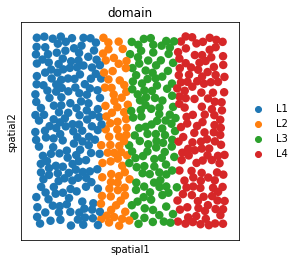

In [530]:
simulation_kd_tree = simulation_domain_canvas.generate_domain_kd_tree()

queried_labels = simulation_kd_tree.query(simulation_coordinates)

simulation_dataframe = ad.AnnData(X=simulation_coordinates)
simulation_dataframe.obsm["spatial"] = simulation_coordinates
simulation_dataframe.obs["domain"] = queried_labels

sc.pl.spatial(test_dataframe, color="domain", img_key=None, size=0.0005)

In [15]:
def synthesize_cell_embeddings(layer_labels, distributions, cell_type_definitions, num_cells, num_real_metagenes, n_noise_metagenes=3, signal_sigma_x=0.1, background_sigma_x=0.03, sigma_x_scale=1.0):
    """Generate synthetic cell embeddings.
    
    """
    
    num_metagenes = num_real_metagenes + n_noise_metagenes
    
    sigma_x = np.concatenate([np.full(num_real_metagenes, signal_sigma_x), np.full(n_noise_metagenes, background_sigma_x)])
    sigma_x = sigma_x * sigma_x_scale

    cell_type_assignments = np.zeros((num_cells), dtype='int')
    Z = np.zeros((num_cells, num_metagenes))
    X = np.zeros((num_cells, num_metagenes))
    
    cell_types = cell_type_definitions.keys()
    
    for layer_index, (layer_name, distribution) in enumerate(distributions.items()):
        layer_cells = layer_labels == layer_name
        distribution = distributions[layer_name]
        layer_cell_types, proportions = zip(*distribution.items())
        
        cell_indices, = np.nonzero(layer_cells)
        random.shuffle(cell_indices)

        partition_indices = (np.cumsum(proportions) * len(cell_indices)).astype(int)
        partitions = np.split(cell_indices, partition_indices[:-1])


        cell_type_to_partition = dict(zip(layer_cell_types, partitions))
        
        for cell_type_index, cell_type in enumerate(cell_types):
            if cell_type not in layer_cell_types:
                continue
                
            partition = cell_type_to_partition[cell_type]
            if len(partition) == 0:
                continue
            
            cell_type_assignments[partition] = cell_type_index
            Z[partition, :num_real_metagenes] = cell_type_definitions[cell_type]
        
   
    # Extrinsic factors
    Z[:, num_real_metagenes:num_metagenes] = 0.05

    # TODO: vectorize
    for cell in range(num_cells):
        for metagene in range(num_metagenes):
            X[cell, metagene] = sigma_x[metagene] * truncnorm.rvs(-Z[cell, metagene]/sigma_x[metagene], 100) + Z[cell, metagene]
    
    X = project_embeddings(X, Z).T
    
    return X, cell_type_assignments

In [16]:
def project_embeddings(X, Z):
    X = X * (Z > 0)
    X = X / np.sum(X, axis=1, keepdims=True)
    
    return X

In [71]:
# cell_type_names = [
#     "Excitatory L1",
#     "Excitatory L2",
#     "Excitatory L3",
#     "Excitatory L4",
#     "Non-Neuron L1",
#     "Non-Neuron Ubiquitous",
#     "Inhibitory 1",
#     "Inhibitory 2",
# ]

class SyntheticDataset(ad.AnnData):
    """Simulated spatial transcriptomics dataset.
    
    Uses AnnData as a base class, with additional methods for simulation.
    """
    
    def __init__(self, num_cells, num_genes, replicate_name, distributions=None, cell_type_definitions=None, metagene_variation_probabilities=None,
                 domain_landmarks=None, shared_metagenes=None):
        """Generate random coordinates (as well as expression values) for a single ST FOV.
        
        """
        self.num_cells = num_cells
        self.num_genes = num_genes
        
        dummy_expression = np.zeros((num_cells, num_genes))
        
        ad.AnnData.__init__(self, X=dummy_expression)
        
        self.name = f"{replicate_name}"
        
        self.uns["layer_names"] = list(distributions.keys())
        self.uns["cell_type_names"] = list(cell_type_definitions.keys())
            
        self.uns["domain_landmarks"] = {
            self.name: domain_landmarks
        }
        self.uns["domain_distributions"] = {
            self.name: distributions
        }
        self.uns["metagene_variation_probabilities"] = {
            self.name: metagene_variation_probabilities
        }
        self.uns["cell_type_definitions"] = {
            self.name: cell_type_definitions
        }
        
#         simulation_coordinates = sample_2D_points(num_cells, minimum_distance)
        
        minimum_distance = 0.75 / np.sqrt(self.num_cells)
        tau = minimum_distance * 2.2
        
        self.obsm["spatial"] = sample_2D_points(self.num_cells, minimum_distance)
        self.domain_canvas = DomainCanvas(self.obsm["spatial"], self.uns["layer_names"], canvas_width=600, density=1)
        
    def simulate_expression(self, mode="metagene_based", predefined_metagenes=None, **simulation_parameters):
            return self.simulate_metagene_based_expression(predefined_metagenes=predefined_metagenes, **simulation_parameters)
    
    def simulate_metagene_based_expression(self, num_real_metagenes, num_noise_metagenes, real_metagene_parameter, noise_metagene_parameter,
                                           sigY_scale, sigX_scale, lambda_s, predefined_metagenes=None):
        """TySc
        
        """
        
        # Get num_genes x num_genes covariance matrix
        self.sig_y = sigY_scale
        num_metagenes = num_real_metagenes + num_noise_metagenes
        if isinstance(self.sig_y, float):
            self.sig_y *= np.identity(self.num_genes) / self.num_genes
            self.variance_y = (self.sig_y**2)
        elif isinstance(self.sig_y, dict):
            self.sig_y = {cell_type: cell_specific_sig_y / self.num_genes for cell_type, cell_specific_sig_y in self.sig_y.items()}
            random_key = next(iter(self.sig_y))
            if isinstance(self.sig_y[random_key], float):
                self.sig_y = {cell_type: cell_specific_sig_y * np.identity(self.num_genes) for cell_type, cell_specific_sig_y in self.sig_y.items()}
            
            self.variance_y = {cell_type: cell_specific_sig_y ** 2 for cell_type, cell_specific_sig_y in self.sig_y.items()}
        
        if predefined_metagenes is None:
            self.uns["ground_truth_M"] = {self.name: synthesize_metagenes(self.num_genes, num_real_metagenes,
                    num_noise_metagenes, real_metagene_parameter, noise_metagene_parameter, metagene_variation_probabilities=self.uns["metagene_variation_probabilities"][self.name
                    ])
            }
        else:
            self.uns["ground_truth_M"] = {self.name: predefined_metagenes}
        
        X_i, C_i = synthesize_cell_embeddings(self.obs["layer"].to_numpy(), self.uns["domain_distributions"][self.name], self.uns["cell_type_definitions"][self.name],
                       self.num_cells, num_real_metagenes, sigma_x_scale=sigX_scale, n_noise_metagenes=num_noise_metagenes)

        self.S = gamma.rvs(num_metagenes, scale=lambda_s, size=self.num_cells)
        self.obsm["ground_truth_X"] = (X_i * self.S).T
        cell_type_encoded = C_i.astype(int)
        cell_type = [self.uns["cell_type_names"][index] for index in cell_type_encoded]
        self.obs["cell_type"] = cell_type
        self.obs["cell_type_encoded"] = cell_type_encoded

        self.X = np.matmul(self.obsm["ground_truth_X"], self.uns["ground_truth_M"][self.name])

        self.sample_noisy_expression()
            
    def sample_noisy_expression(self):
        for cell, cell_type in zip(range(self.num_cells), self.obs["cell_type_encoded"].to_numpy()):
            if isinstance(self.variance_y, dict):
                cell_type_variance_y = self.variance_y[int(cell_type)]
            else:
                cell_type_variance_y = self.variance_y

            # Ensure that gene expression is positive
            self.X[cell] = np.abs(sample_gaussian(cell_type_variance_y, self.X[cell]))
            
    def annotate_layer(self):
        return self.domain_canvas.annotate_domain()
        
    def assign_layer_labels(self):
        domain_kd_tree = self.domain_canvas.generate_domain_kd_tree()
        self.obs["layer"] = domain_kd_tree.query(self.obsm["spatial"])
        self.uns["domain_landmarks"] = self.domain_canvas.domains
        

In [18]:
cell_type_definitions = {
    "Excitatory L1":         [1, 0, 0, 0, 0, 0, 1, 0, 0, 0],
    "Excitatory L2":         [1, 0, 0, 0, 0, 0, 0, 1, 0, 0],
    "Excitatory L3":         [1, 0, 0, 0, 0, 0, 0, 0, 1, 0],
    "Excitatory L4":         [1, 0, 0, 0, 0, 0, 0, 0, 0, 1],
    "Inhibitory 1":          [0, 1, 1, 0, 0, 0, 0, 0, 0, 0],
    "Inhibitory 2":          [0, 1, 0, 1, 0, 0, 0, 0, 0, 0],
    "Non-Neuron L1":         [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
    "Non-Neuron Ubiquitous": [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
}

simulation_parameters = {
#     "name": f"{variance_option}_variance_{beta_option}_covariance_{replicate_variability}_replicate_variability_random_seed_{run}",
#     'num_cells': 500,
#     'num_genes': 100,
    'num_real_metagenes': 10,
    'num_noise_metagenes': 2,
#     'num_replicates': 4,
#     'sigY_scale': {
#         cell_type: covariance_matrix for cell_type, covariance_matrix in zip(range(len(cell_type_names)), covariance_matrices)
#     },
    'sigY_scale': 3.0,
    'sigX_scale': 1.0,
#                 "gamma_shape": 4.0,
    "real_metagene_parameter": 4.0,
    "noise_metagene_parameter": 8.0,
    'lambda_s': 1.0,
#     "cell_type_names": cell_type_names,
#     "gene_replace_prob": 0,
#     "replicate_variability": replicate_variability
}

metagene_variation_probabilities = [0, 0.25, 0, 0.25, 0, 0.25, 0, 0.1, 0.1, 0.1]

In [ ]:
data = SyntheticDataset(500, 100, "0", layer_distributions, cell_type_definitions, metagene_variation_probabilities)

In [ ]:
data.annotate_layer()

In [1168]:
data.assign_layer_labels()

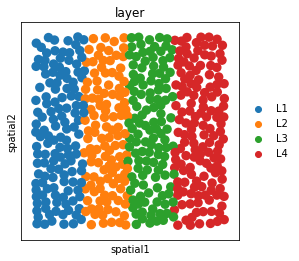

In [1169]:
sc.pl.spatial(data,
              color="layer",
              spot_size=0.05)

In [959]:
data.simulate_expression(**simulation_parameters)

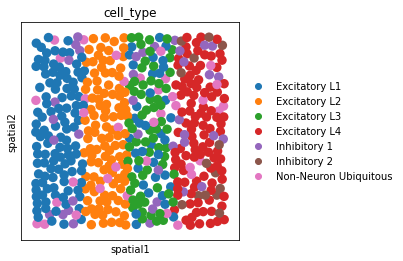

In [960]:
sc.pl.spatial(data,
              color="cell_type",
              spot_size=0.05)

In [1193]:
sc.pp.neighbors(data)
sc.tl.umap(data)

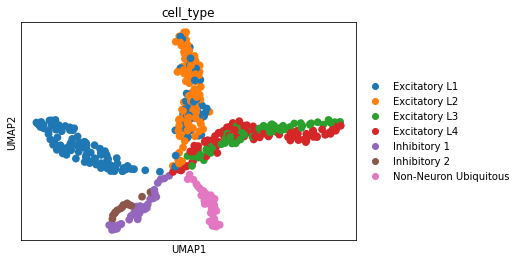

In [1194]:
sc.pl.umap(data,
           color="cell_type")

## Spatial batch effect simulation

In [25]:
class SpatialBatchEffectDataset(SyntheticDataset):
    """Simulation dataset with gradient-like batch effect.
    
    """
    def __init__(self, num_cells, num_genes, replicate_name, distributions=None, cell_type_definitions=None, metagene_variation_probabilities=None,
                 domain_landmarks=None, shared_metagenes=None):
        super().__init__(num_cells, num_genes, replicate_name, distributions, cell_type_definitions, metagene_variation_probabilities,
                 domain_landmarks, shared_metagenes)
        
    def simulate_expression(self, spatial_function, spatial_metagene_index, mode="metagene_based", **simulation_parameters):
        super().simulate_expression(**simulation_parameters)
        
        spatial_effect = spatial_function(self.obsm["spatial"])

        self.obsm["ground_truth_X"][:, spatial_metagene_index] += spatial_effect
        self.obsm["ground_truth_X"] = (project_embeddings(self.obsm["ground_truth_X"] / self.S[:, np.newaxis])) * self.S[:, np.newaxis]
        
        self.X = np.matmul(self.obsm["ground_truth_X"], self.uns["ground_truth_M"][self.name])
        self.sample_noisy_expression()

In [1454]:
batch_effect = SpatialBatchEffectDataset(500, 100, "0", layer_distributions, cell_type_definitions, metagene_variation_probabilities)

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.


In [1458]:
batch_effect.annotate_layer()

Choose a domain to annotate (enter an integer):
0: L1
1: L2
2: L3
3: L4
3


Output()

Canvas(height=600, image_data=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x02X\x00\x00\x02X\x08\x06\x00\x00\…

In [1465]:
batch_effect.assign_layer_labels()

def right_gradient(coordinates, alpha=0):
    return alpha * coordinates[:, 0]

batch_effect.simulate_expression(right_gradient, 9, **simulation_parameters)

In [51]:
def plot_metagene_embedding(synthetic_dataset, metagene_index):
    points = synthetic_dataset.obsm["spatial"]
    x, y = points.T
    spatial_effect = synthetic_dataset.obsm["ground_truth_X"][:, metagene_index]

    biased_batch_effect = pd.DataFrame({"x":x, "y":y, "spatial_metagene":spatial_effect})
    sns.scatterplot(data=biased_batch_effect, x="x", y="y", hue="spatial_metagene")
    
plot_metagene_embedding(batch_effect, 9)

NameError: name 'batch_effect' is not defined

NameError: name 'batch_effect' is not defined

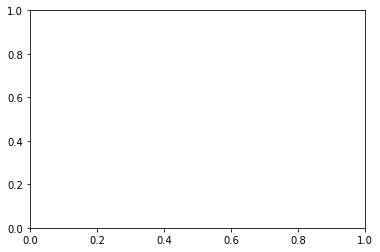

In [52]:
fig, ax = plt.subplots()
sc.pp.neighbors(batch_effect)
sc.tl.umap(batch_effect)
sc.pl.umap(batch_effect, color="cell_type", ax=ax)

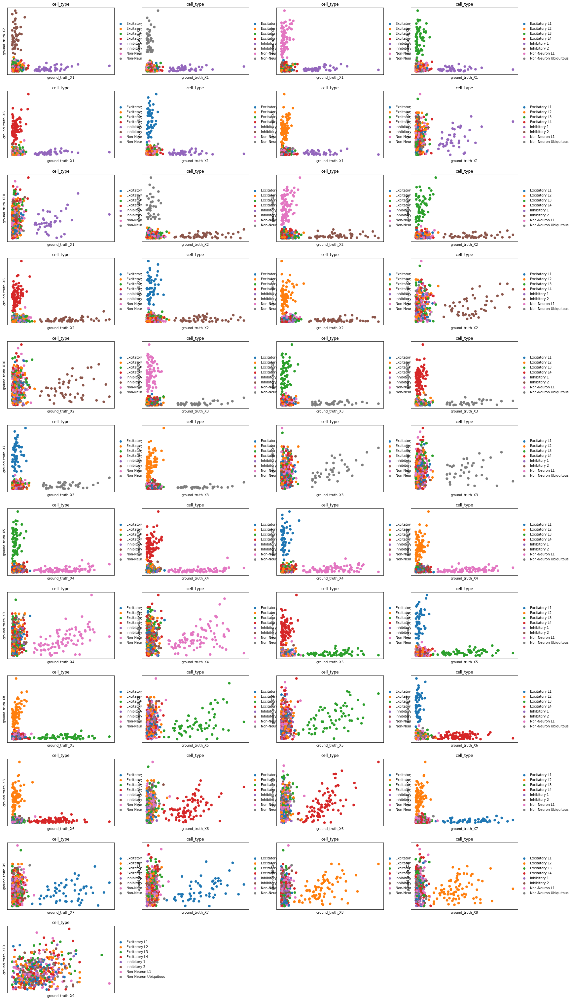

In [1468]:
sc.pl.embedding(batch_effect, color="cell_type",
                components="all",
                basis="ground_truth_X")

## Multireplicate simulation

In [19]:
cell_type_definitions = {
    "Excitatory L1":         [1, 0, 0, 0, 0, 0, 1, 0, 0, 0],
    "Excitatory L2":         [1, 0, 0, 0, 0, 0, 0, 1, 0, 0],
    "Excitatory L3":         [1, 0, 0, 0, 0, 0, 0, 0, 1, 0],
    "Excitatory L4":         [1, 0, 0, 0, 0, 0, 0, 0, 0, 1],
    "Inhibitory 1":          [0, 1, 1, 0, 0, 0, 0, 0, 0, 0],
    "Inhibitory 2":          [0, 1, 0, 1, 0, 0, 0, 0, 0, 0],
    "Non-Neuron L1":         [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
    "Non-Neuron Ubiquitous": [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
}
layer_distributions = {
    "L1": {
        "Excitatory L1": 0.33,
        "Inhibitory 1": 0.1,
        "Non-Neuron L1": 0.5,
        "Non-Neuron Ubiquitous": 0.07
    },
    "L2": {
        "Excitatory L2": 0.93,
        "Non-Neuron Ubiquitous": 0.07
    },
    "L3": {
        "Excitatory L3": 0.53,
        "Inhibitory 1": 0.1,
        "Inhibitory 2": 0.3,
        "Non-Neuron Ubiquitous": 0.07
    },
    "L4": {
        "Excitatory L4": 0.73,
        "Inhibitory 1": 0.1,
        "Inhibitory 2": 0.1,
        "Non-Neuron Ubiquitous": 0.07
    },
}

shifted_distributions = {
    "L1": {
        "Excitatory L1": 0.83,
        "Inhibitory 1": 0.1,
        "Non-Neuron Ubiquitous": 0.07
    },
    "L2": {
        "Excitatory L2": 0.43,
        "Non-Neuron L1": 0.5,
        "Non-Neuron Ubiquitous": 0.07
    },
    "L3": {
        "Excitatory L3": 0.53,
        "Inhibitory 1": 0.1,
        "Inhibitory 2": 0.3,
        "Non-Neuron Ubiquitous": 0.07
    },
    "L4": {
        "Excitatory L4": 0.73,
        "Inhibitory 1": 0.1,
        "Inhibitory 2": 0.1,
        "Non-Neuron Ubiquitous": 0.07
    },
}

simulation_parameters = {
#     "name": f"{variance_option}_variance_{beta_option}_covariance_{replicate_variability}_replicate_variability_random_seed_{run}",
#     'num_cells': 500,
#     'num_genes': 100,
    'num_real_metagenes': 10,
    'num_noise_metagenes': 2,
#     'num_replicates': 4,
#     'sigY_scale': {
#         cell_type: covariance_matrix for cell_type, covariance_matrix in zip(range(len(cell_type_names)), covariance_matrices)
#     },
    'sigY_scale': 2.0,
    'sigX_scale': 2.0,
#                 "gamma_shape": 4.0,
    "real_metagene_parameter": 4.0,
    "noise_metagene_parameter": 8.0,
    'lambda_s': 1.0,
#     "cell_type_names": cell_type_names,
#     "gene_replace_prob": 0,
#     "replicate_variability": replicate_variability
}

metagene_variation_probabilities = [0, 0.25, 0, 0.25, 0, 0.25, 0, 0.1, 0.1, 0.1]

In [20]:
from scipy.sparse import csr_matrix
def remove_connectivity_artifacts(sparse_distance_matrix):
    dense_distances = sparse_distance_matrix.toarray()
    distances = sparse_distance_matrix.data
    cutoff = np.percentile(distances, 94.5)
    mask = dense_distances < cutoff
    
    return csr_matrix(dense_distances * mask)

In [61]:
class MultiReplicateSyntheticDataset():
    """Synthetic multireplicate dataset to model biological variation and batch effects
    in spatial transcriptomics data.
    
    """
    
    def __init__(self, num_cells, num_genes, replicate_parameters, dataset_class, random_state=0): 
        self.datasets = {}
        self.replicate_parameters = replicate_parameters
        np.random.seed(random_state)
        random.seed(random_state)

        for replicate_name in self.replicate_parameters:
            synthetic_dataset = dataset_class(num_cells, num_genes, replicate_name, **self.replicate_parameters[replicate_name])
            self.datasets[replicate_name] = synthetic_dataset
    
    def annotate_replicate_layer(self, replicate_name):
        print(f"Annotating replicate {replicate_name}")

        return self.datasets[replicate_name].annotate_layer()
    
    def assign_layer_labels(self):
        for replicate_dataset in self.datasets.values():
            replicate_dataset.assign_layer_labels()
            
    def simulate_expression(self, replicate_simulation_parameters):
        """Convenience method for shared simulation parameters between all replicates.
        
        """
        
        metagenes = None
        for replicate_name, replicate_dataset in self.datasets.items():
            print(replicate_name)
            simulation_parameters = replicate_simulation_parameters[replicate_name]
            replicate_dataset.simulate_expression(predefined_metagenes=metagenes, **simulation_parameters)
            metagenes = replicate_dataset.uns["ground_truth_M"][replicate_name]
            
    def calculate_neighbors(self):
        for replicate, dataset in self.datasets.items():
            sq.gr.spatial_neighbors(dataset, coord_type="generic", delaunay=True)
            dataset.obsp["spatial_connectivities"] = remove_connectivity_artifacts(dataset.obsp["spatial_distances"])
            dataset.obsp["adjacency_matrix"] = dataset.obsp["spatial_connectivities"]

In [79]:
replicate_parameters = {
    "normal": {
        "distributions": layer_distributions,
        "cell_type_definitions": cell_type_definitions,
        "metagene_variation_probabilities": metagene_variation_probabilities
    },
    "shifted": {
        "distributions": layer_distributions,
        "cell_type_definitions": cell_type_definitions,
        "metagene_variation_probabilities": metagene_variation_probabilities
    }
}

multireplicate_dataset = MultiReplicateSyntheticDataset(500, 100, replicate_parameters, SyntheticDataset)

/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


In [83]:
multireplicate_dataset.annotate_replicate_layer("normal")

Annotating replicate normal
Choose a domain to annotate (enter an integer):
0: L1
1: L2
2: L3
3: L4
3


Output()

Canvas(height=600, image_data=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x02X\x00\x00\x02X\x08\x06\x00\x00\…

In [84]:
# annotated_domains = multireplicate_dataset.datasets["normal"].domain_canvas.domains
multireplicate_dataset.datasets["normal"].domain_canvas.load_domains(annotated_domains)

In [55]:
# annotated_domains = multireplicate_dataset.datasets["normal"].domain_canvas.domains

multireplicate_dataset.datasets["shifted"].domain_canvas.load_domains(annotated_domains)

In [56]:
multireplicate_dataset.datasets["shifted"].domain_canvas.display()

Output()

Canvas(height=601, layout=Layout(height='601px', width='600px'), width=600)

In [219]:
multireplicate_dataset.assign_layer_labels()

In [220]:
# Same parameters for each replicate (for now)
replicate_simulation_parameters = {
    "normal": simulation_parameters,
    "shifted": simulation_parameters
}

multireplicate_dataset.simulate_expression(replicate_simulation_parameters)

normal
[[0.00869489 0.01790884 0.01307564 ... 0.00553606 0.00309114 0.00498795]
 [0.0087178  0.01795604 0.0131101  ... 0.00555065 0.00309928 0.00914235]
 [0.01226411 0.00641423 0.00381256 ... 0.00687058 0.01184297 0.00708802]
 ...
 [0.01018784 0.01597395 0.00262269 ... 0.00474457 0.00804715 0.01521657]
 [0.00720052 0.00993769 0.01129845 ... 0.00548139 0.01515252 0.01444347]
 [0.00511132 0.00470818 0.01362149 ... 0.00622508 0.0054909  0.00467198]]
shifted
[[0.00869489 0.01790884 0.01307564 ... 0.00553606 0.00309114 0.00498795]
 [0.0087178  0.01795604 0.0131101  ... 0.00555065 0.00309928 0.00914235]
 [0.01226411 0.00641423 0.00381256 ... 0.00687058 0.01184297 0.00708802]
 ...
 [0.01018784 0.01597395 0.00262269 ... 0.00474457 0.00804715 0.01521657]
 [0.00720052 0.00993769 0.01129845 ... 0.00548139 0.01515252 0.01444347]
 [0.00511132 0.00470818 0.01362149 ... 0.00622508 0.0054909  0.00467198]]


         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


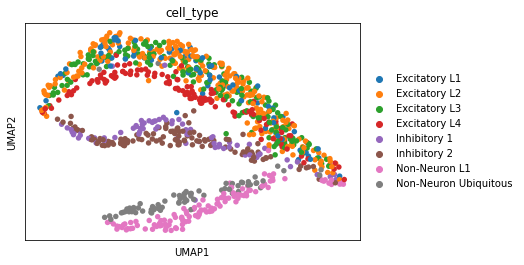

In [221]:
replicate_names, dataset_copies = zip(*multireplicate_dataset.datasets.items())
merged_dataset = ad.concat(dataset_copies, label="batch", keys=replicate_names, merge="unique", uns_merge="unique", pairwise=True)                                                                                                                                        
fig, ax = plt.subplots()
sc.pp.neighbors(merged_dataset)
sc.tl.umap(merged_dataset)
sc.pl.umap(merged_dataset, color="cell_type", ax=ax)

         Falling back to preprocessing with `sc.pp.pca` and default params.


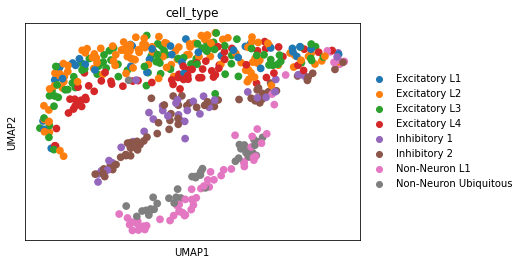

         Falling back to preprocessing with `sc.pp.pca` and default params.


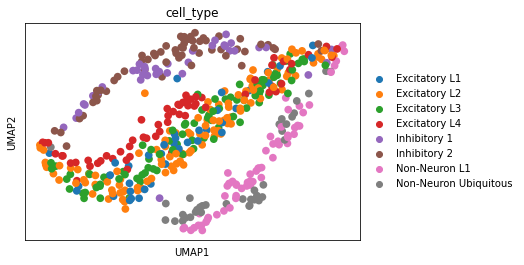

In [222]:
for (replicate_name, replicate_dataset) in multireplicate_dataset.datasets.items():
    fig, ax = plt.subplots()
    sc.pp.neighbors(replicate_dataset)
    sc.tl.umap(replicate_dataset)
    sc.pl.umap(replicate_dataset, color="cell_type", ax=ax)

In [1286]:
! mkdir ../../data/synthetic_cortex/multireplicate_batch_effect_test/

mkdir: cannot create directory ‘../../data/synthetic_cortex/multireplicate_batch_effect_test/’: File exists


In [1304]:
(replicate_names, datasets) = zip(*multireplicate_dataset.datasets.items())

for dataset in datasets:
    sq.gr.spatial_neighbors(dataset, coord_type="generic", delaunay=True)
    dataset.obsp["spatial_connectivities"] = remove_connectivity_artifacts(dataset.obsp["spatial_distances"])
    dataset.obsp["adjacency_matrix"] = dataset.obsp["spatial_connectivities"]
        
save_anndata("../../data/synthetic_cortex/multireplicate_batch_effect_test/processed_dataset.h5ad", datasets, replicate_names)

/work/magroup/shahula/spatiotemporal_transcriptomics_integration/SpiceMixPlus/SpiceMix/load_data.py:144: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  obsp=dataset.obsp,
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 1000 × 100
    obs: 'layer', 'cell_type', 'cell_type_encoded', 'batch'
    uns: 'layer_names', 'cell_type_names', 'domain_landmarks', 'domain_distributions', 'metagene_variation_probabilities', 'cell_type_definitions', 'ground_truth_M', 'neighbors', 'umap', 'cell_type_colors', 'spatial_neighbors'
    obsm: 'spatial', 'ground_truth_X', 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities', 'spatial_connectivities', 'spatial_distances', 'adjacency_matrix'

In [1305]:
dataset.uns["spatial_neighbors"]

{'connectivities_key': 'spatial_connectivities',
 'distances_key': 'spatial_distances',
 'params': {'n_neighbors': 6,
  'coord_type': 'generic',
  'radius': None,
  'transform': None}}

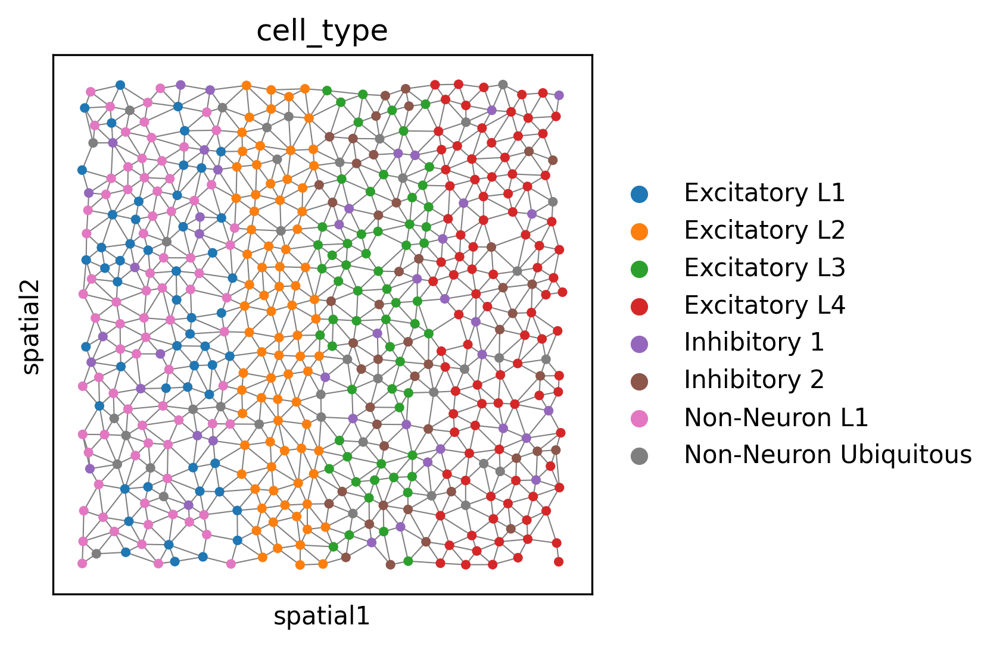

In [1570]:
fig, ax = plt.subplots(dpi=300)
sc.pl.spatial(datasets[0], spot_size=0.02, neighbors_key="spatial_neighbors",
              color="cell_type", edges=True,  edges_width=0.5, ax=ax)

### Generate noise levels and random seeds

In [85]:
from spicemix.analysis import plot_in_situ, compute_empirical_correlations, multireplicate_heatmap
from spicemix.model import SpiceMixPlus

In [86]:
def compute_empirical_correlations(trained_model: SpiceMixPlus, feature: str = "X", output: str = "empirical_correlation"):
    """Compute the empirical spatial correlation for a feature set across all datasets.

    Args:
        trained_model: the trained SpiceMixPlus model.
        feature: key in `.obsm` of feature set for which spatial correlation should be computed.
        output: key in `.uns` where output correlation matrices should be stored.
    """

    datasets = trained_model.datasets
    num_replicates = len(datasets)

    first_dataset = datasets[0]
    N, K = first_dataset.obsm[feature].shape
    scaling = trained_model.parameter_optimizer.spatial_affinity_state.scaling                                                                                                                                                                                
    empirical_correlations = np.zeros([num_replicates, K, K])
    for replicate, dataset in enumerate(datasets):
        adjacency_list = dataset.obs["adjacency_list"]
        X = dataset.obsm[feature]
        Z = X / np.linalg.norm(X, axis=1, keepdims=True, ord=1)
        edges = np.array([(i, j) for i, e in enumerate(adjacency_list) for j in e])

        x = Z[edges[:, 0]]
        y = Z[edges[:, 1]]
        x = x - x.mean(axis=0, keepdims=True)
        y = y - y.mean(axis=0, keepdims=True)
        y_std = y.std(axis=0, keepdims=True)
        x_std = x.std(axis=0, keepdims=True)
        corr = (y / y_std).T @ (x / x_std) / len(x)
        empirical_correlations[replicate] = - corr

    # Symmetrizing and zero-centering empirical_correlation
    empirical_correlations = (empirical_correlations + np.transpose(empirical_correlations, (0, 2, 1))) / 2
    empirical_correlations -= empirical_correlations.mean(axis=(1, 2), keepdims=True)
    empirical_correlations *= scaling

    for dataset, empirical_correlation in zip(datasets, empirical_correlations):
        all_correlations = {dataset.name: empirical_correlation}
        dataset.uns[output] = all_correlations


In [87]:
from scipy.stats import zscore
from sklearn.decomposition import NMF
from sklearn.metrics import adjusted_rand_score

def train_sklearn_NMF(data, K, seed):
    sklearn_nmf_control = NMF(n_components=K, init='random', random_state=seed, max_iter=1000)
    embeddings = sklearn_nmf_control.fit_transform(data.X)
    
    sklearn_results = ad.AnnData(data.X)
    sklearn_results.obsm["spatial"] = data.obsm["spatial"]
    sklearn_results.obs["cell_type"] = data.obs["cell_type"]

    sklearn_results.obsm["X"] = embeddings
    sklearn_results.obsm["normalized_X"] = zscore(sklearn_results.obsm["X"])
    sc.pp.neighbors(sklearn_results, use_rep="X")
    
    return sklearn_results
    
def report_sklearn_NMF(sklearn_results):
    sc.tl.leiden(sklearn_results)
    sc.pl.spatial(sklearn_results, color="leiden", spot_size=0.05)
    
    sklearn_ari = adjusted_rand_score(sklearn_results.obs["cell_type"], sklearn_results.obs["leiden"])
    sklearn_results.uns["ari"] = sklearn_ari
    print(f"sklearn ARI: {sklearn_ari}")

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 0	


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


normal
shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


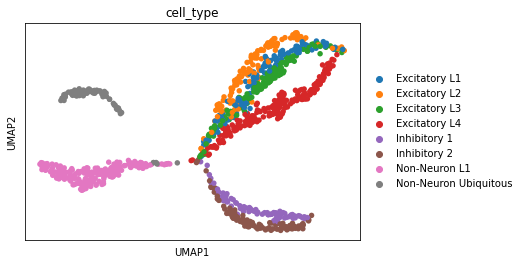

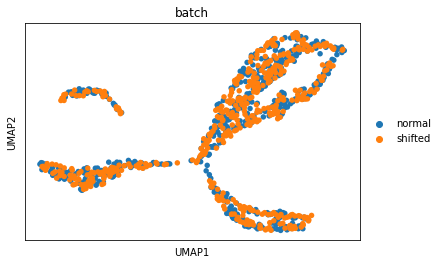

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


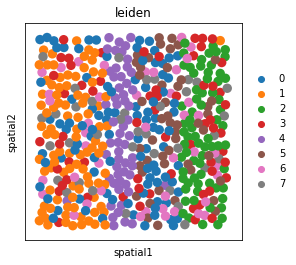

sklearn ARI: 0.7209137121936307


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


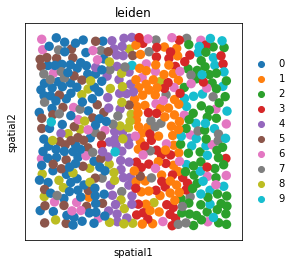

sklearn ARI: 0.8111637100954957


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

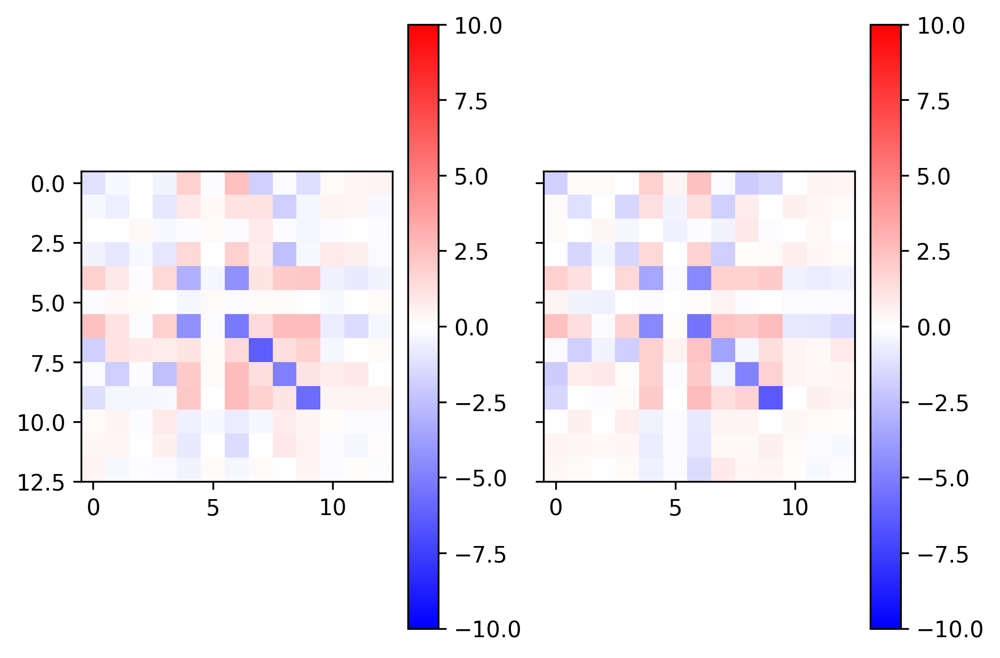

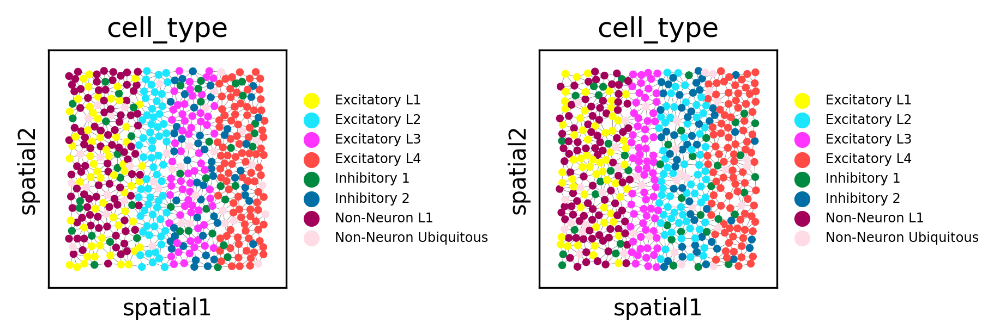

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 1	


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


normal
shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


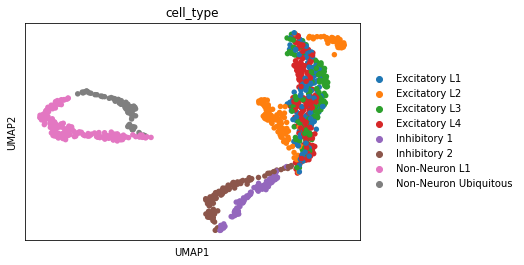

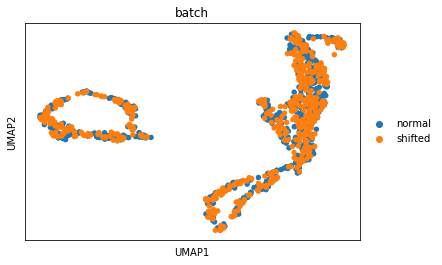

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


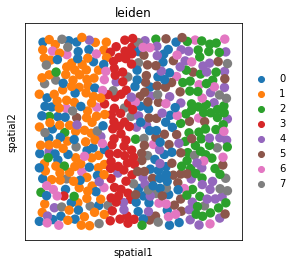

sklearn ARI: 0.7320058954139014


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


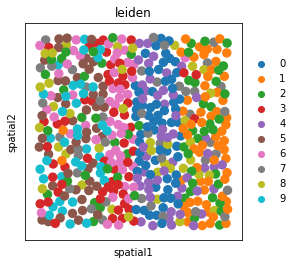

sklearn ARI: 0.6518309753531013


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

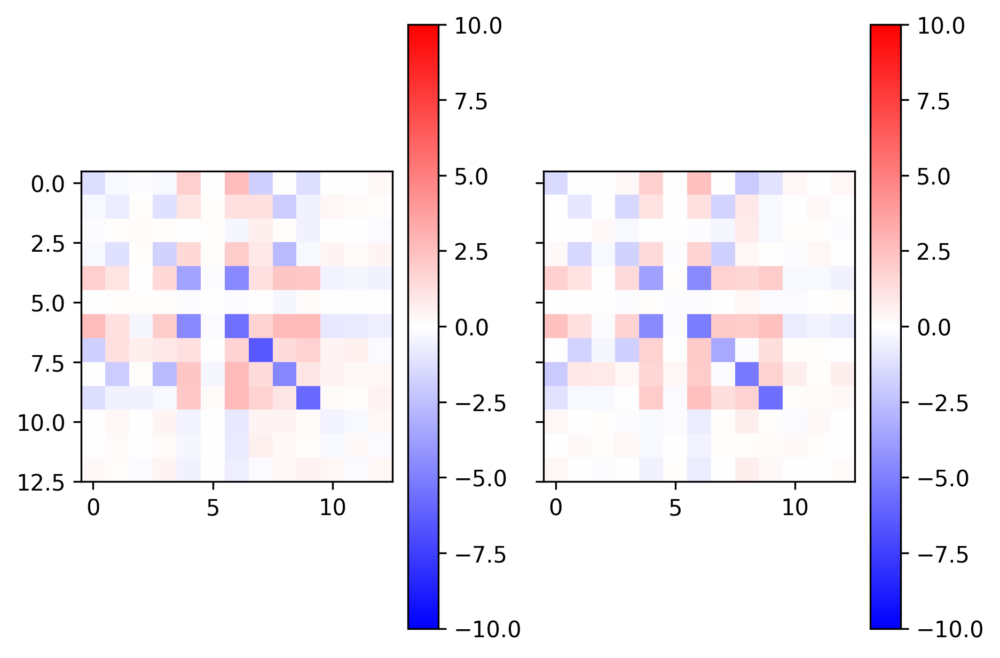

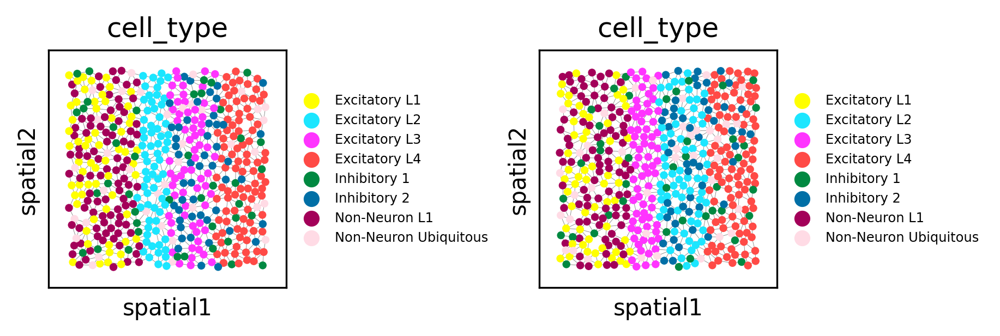

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 2	


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


normal
shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


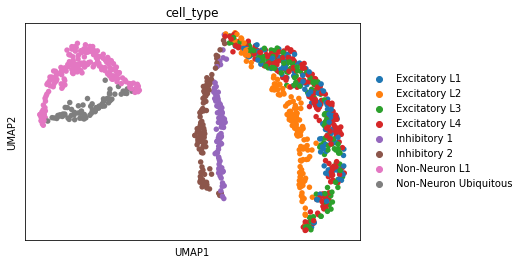

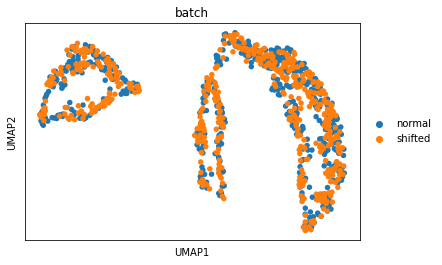

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


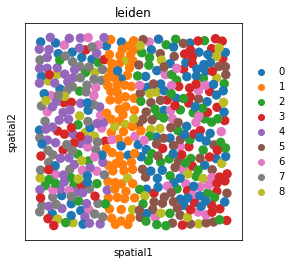

sklearn ARI: 0.543283448396016


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


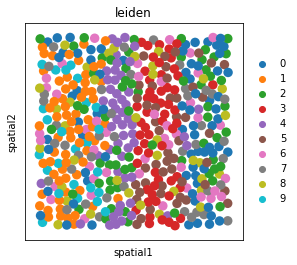

sklearn ARI: 0.592046239943496


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

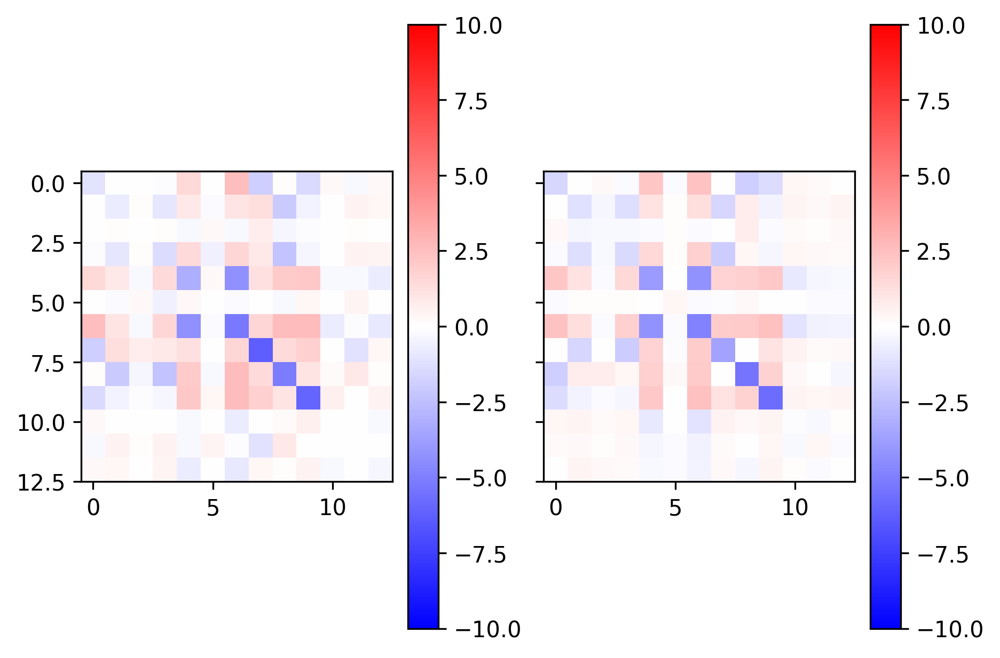

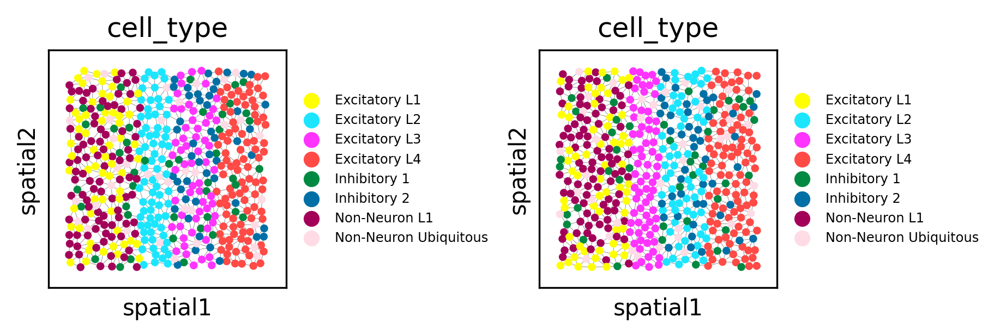

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 3	


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


normal
shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


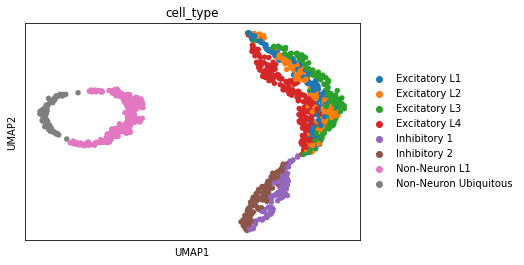

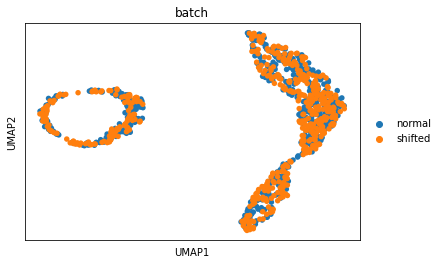

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


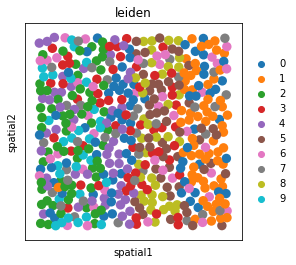

sklearn ARI: 0.6017147479027011


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


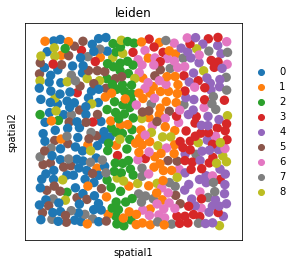

sklearn ARI: 0.7290754499403796


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

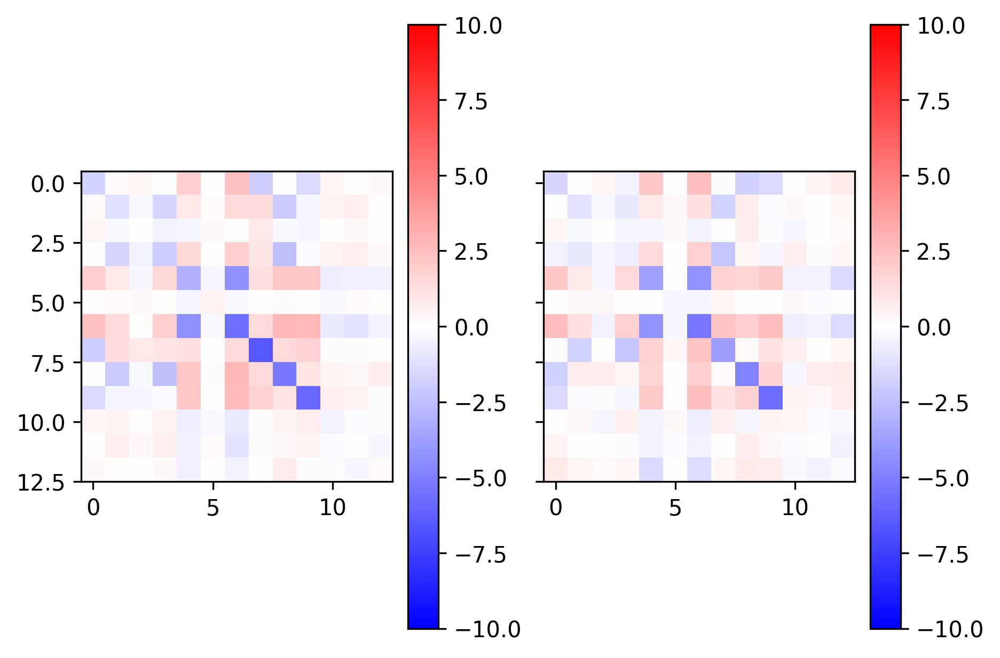

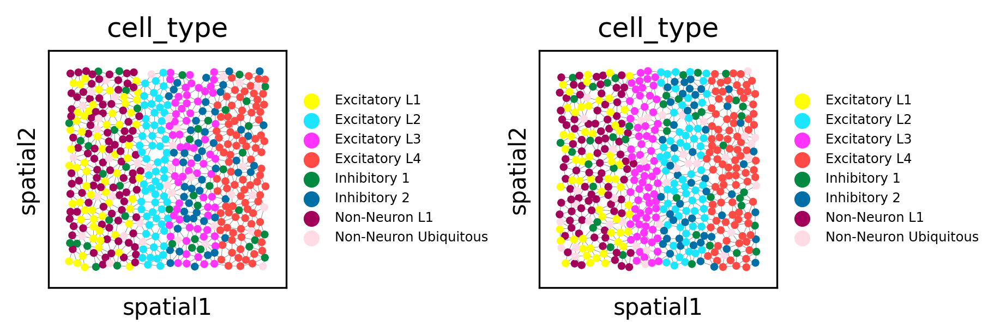

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 4	


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


normal
shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


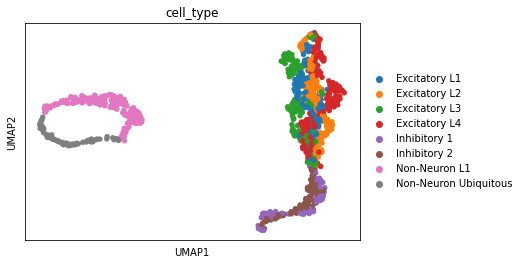

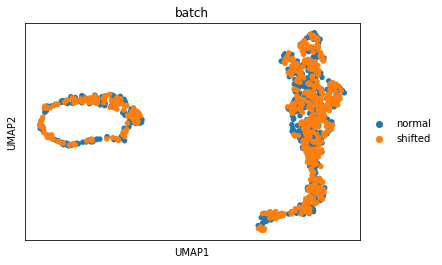

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


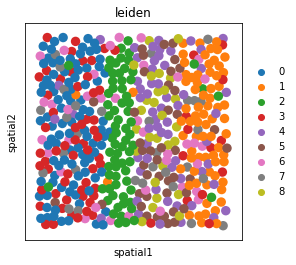

sklearn ARI: 0.7973397816040912


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


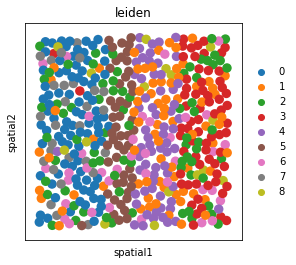

sklearn ARI: 0.7351292548049174


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

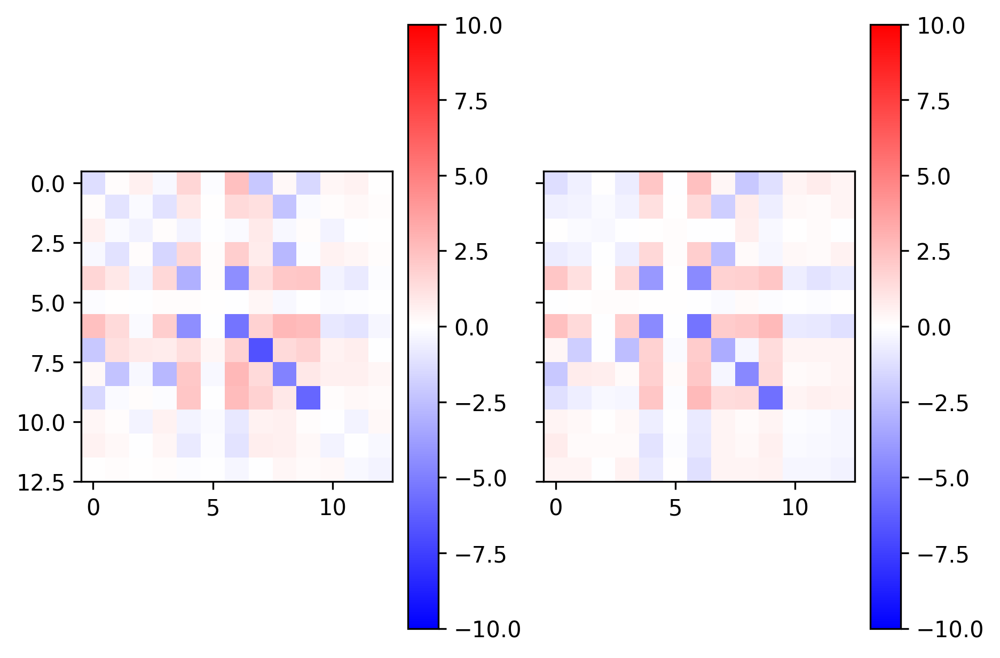

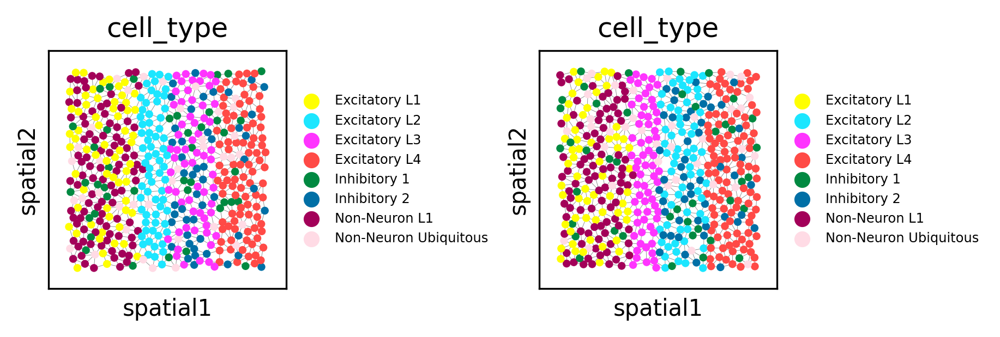

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 5	


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


normal
shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


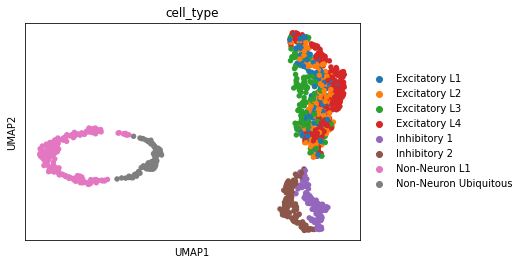

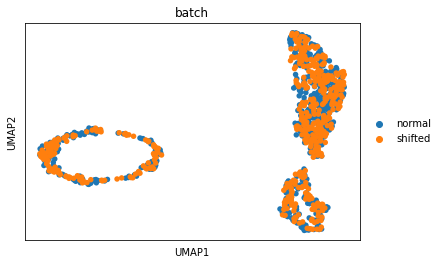

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


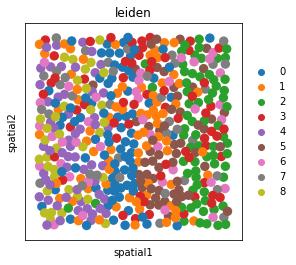

sklearn ARI: 0.5379437537590485


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


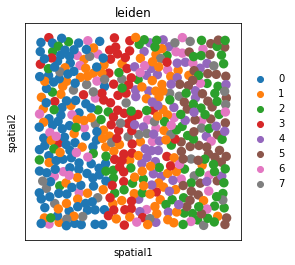

sklearn ARI: 0.6278009316503165


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

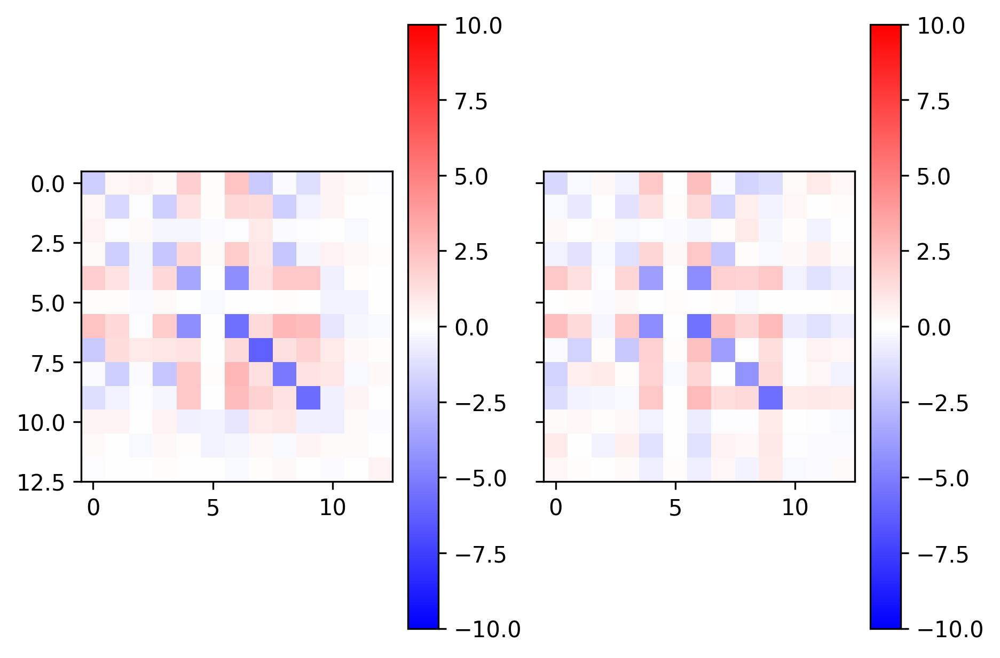

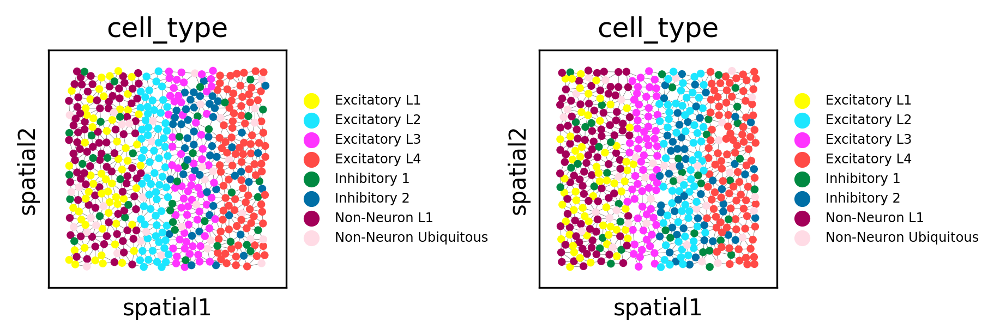

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 6	


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


normal
shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


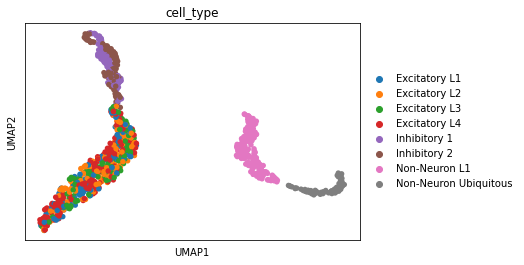

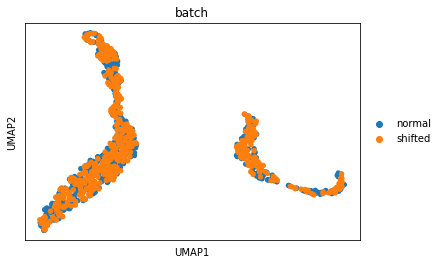

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


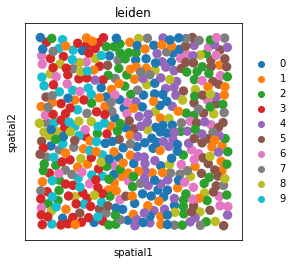

sklearn ARI: 0.44848097408445664


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


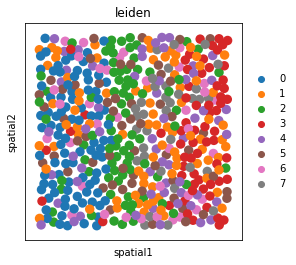

sklearn ARI: 0.5639284006298045


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

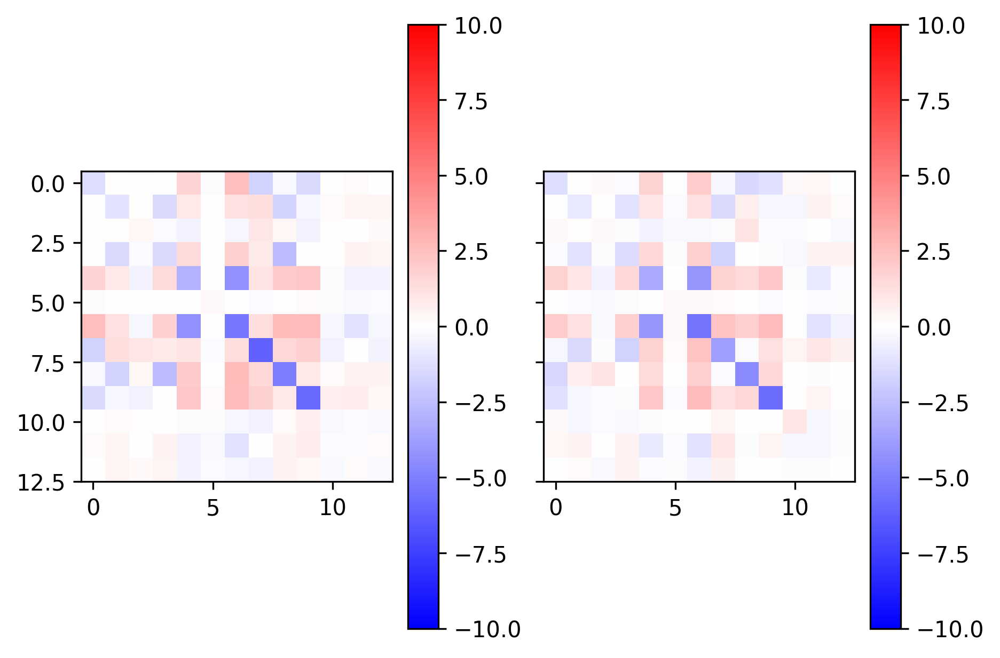

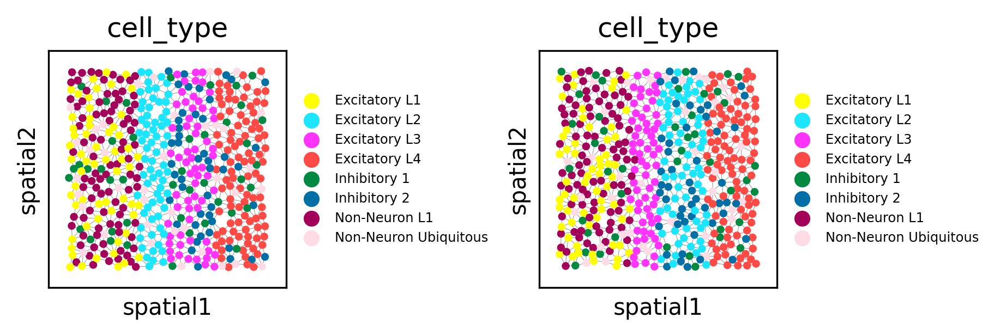

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 7	


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


normal
shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


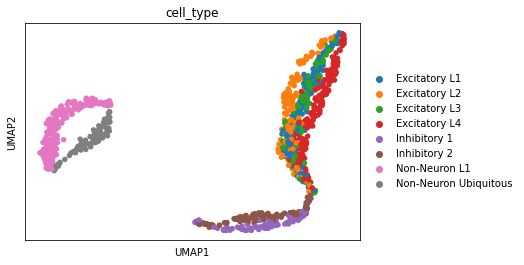

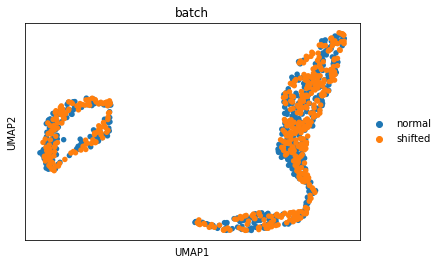

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


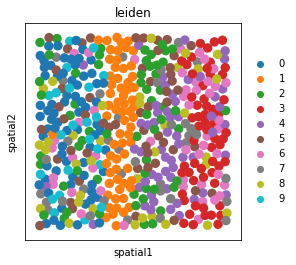

sklearn ARI: 0.6606949855383167


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


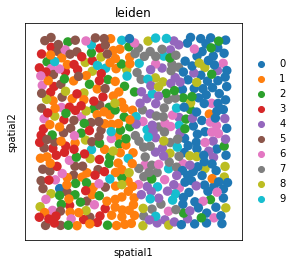

sklearn ARI: 0.6534479437013956


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

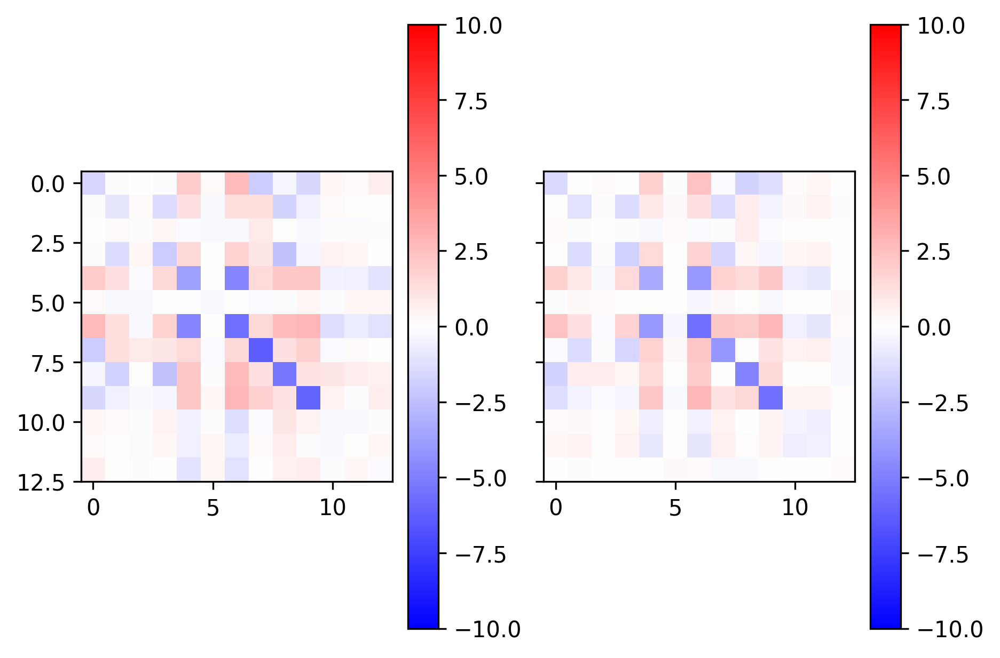

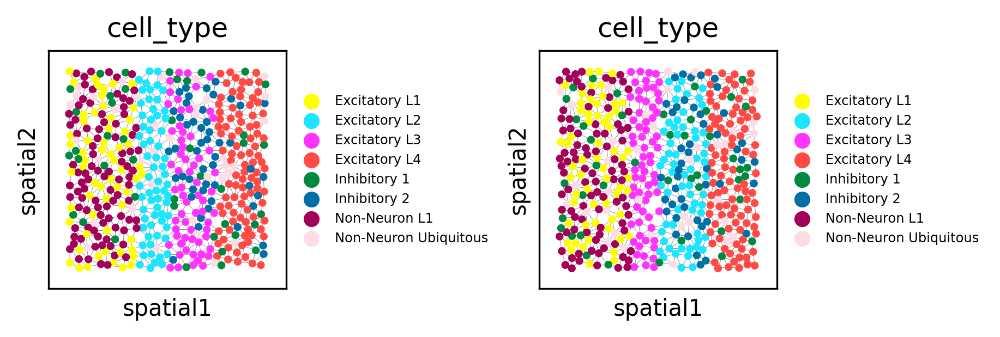

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 8	


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


normal
shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


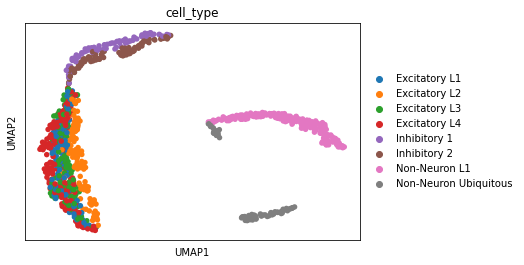

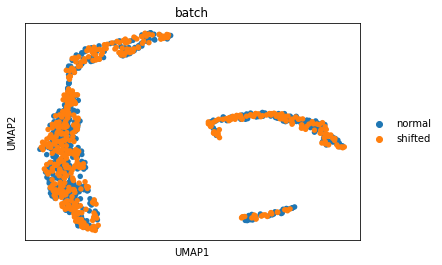

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


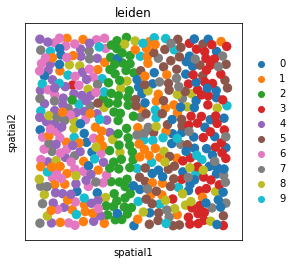

sklearn ARI: 0.6049459061229971


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


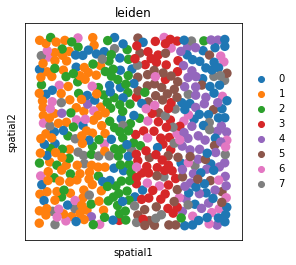

sklearn ARI: 0.6702016592135884


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

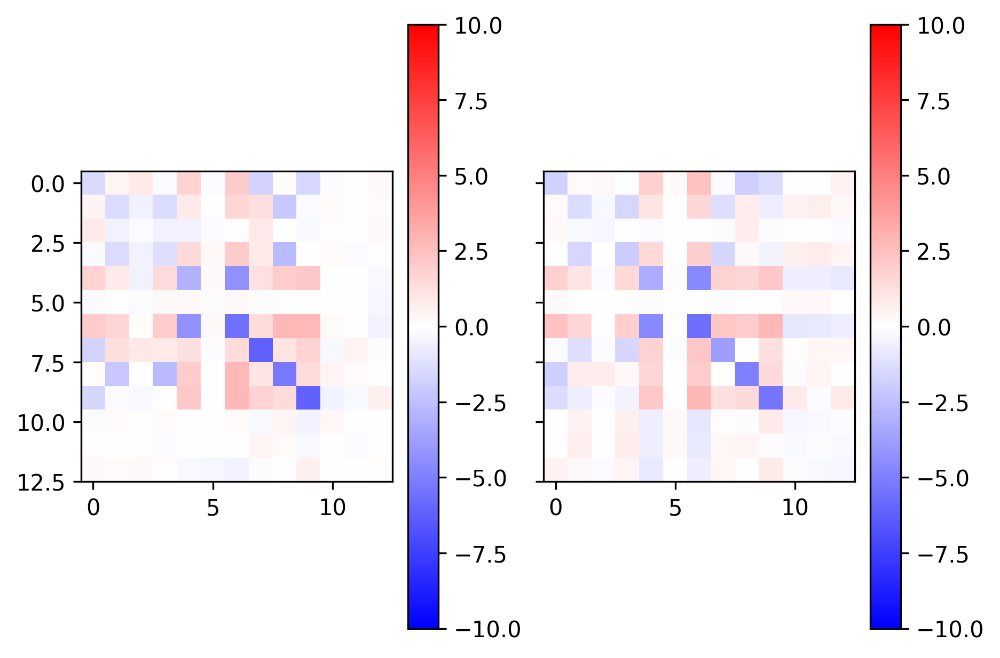

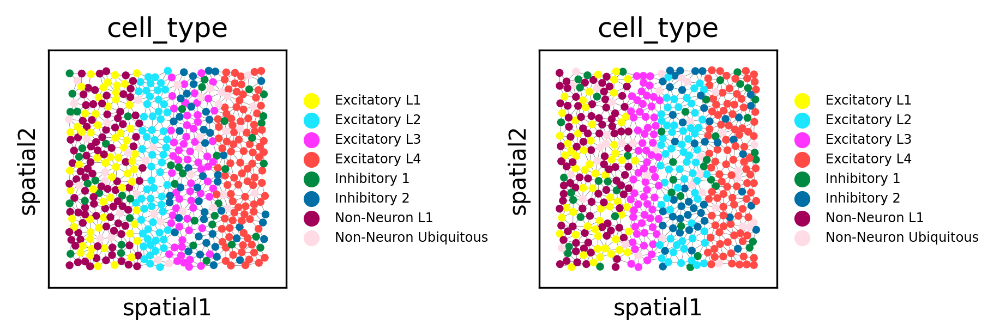

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 9	


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


normal
shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


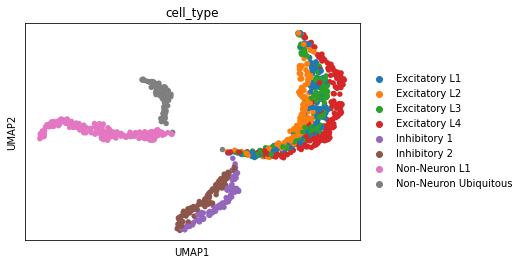

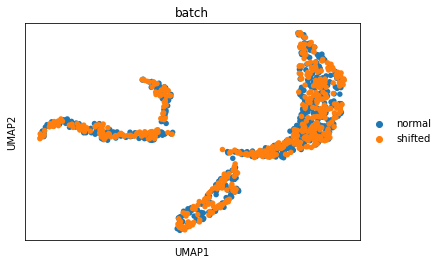

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


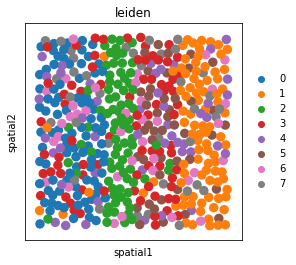

sklearn ARI: 0.757559837481603


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


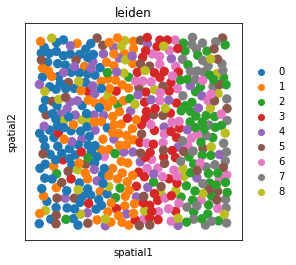

sklearn ARI: 0.6746868866726586


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

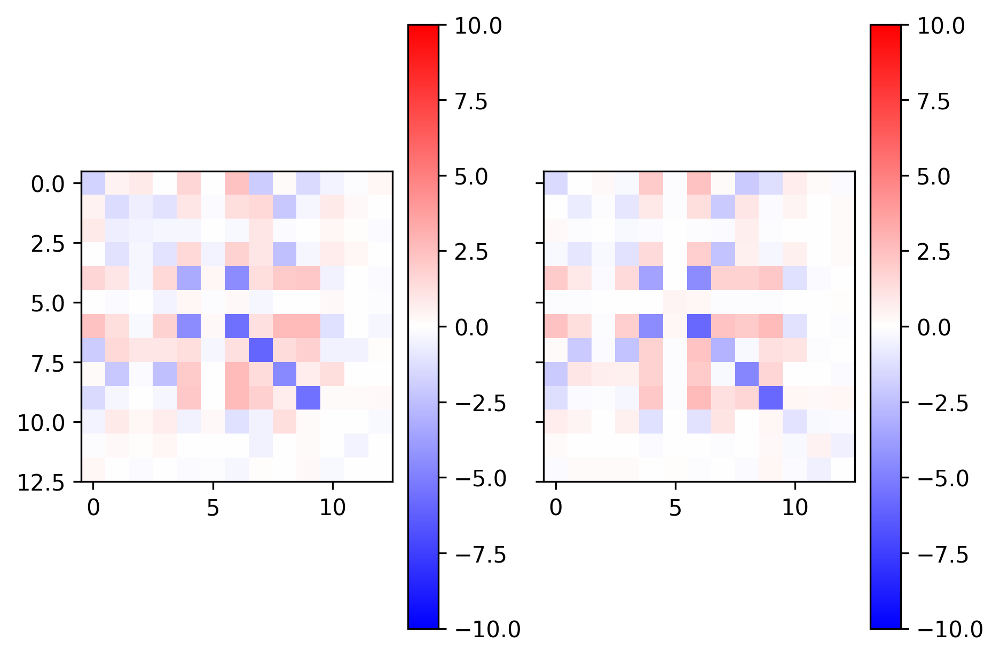

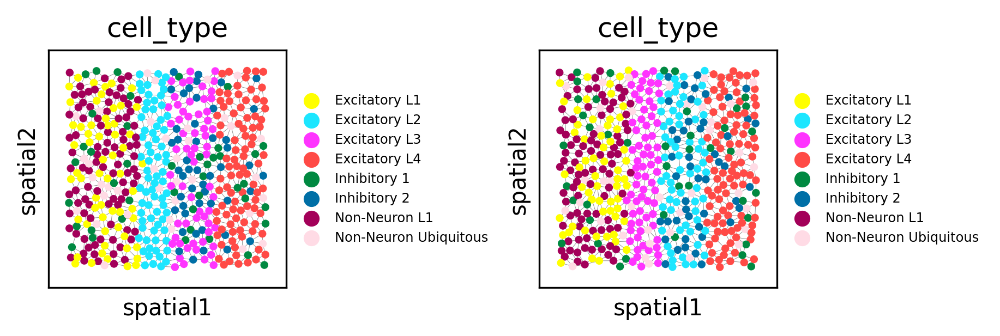

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 10	


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


normal
shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


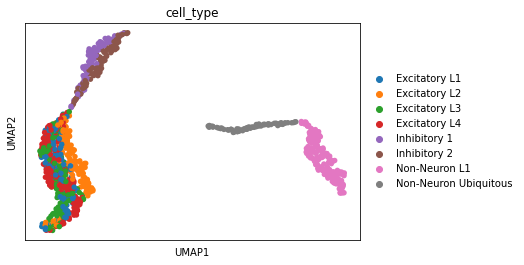

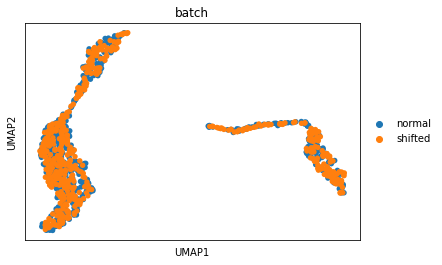

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


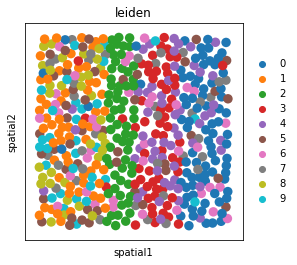

sklearn ARI: 0.7465062810591668


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


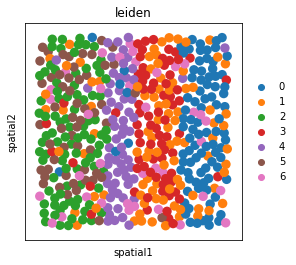

sklearn ARI: 0.8236335851871647


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

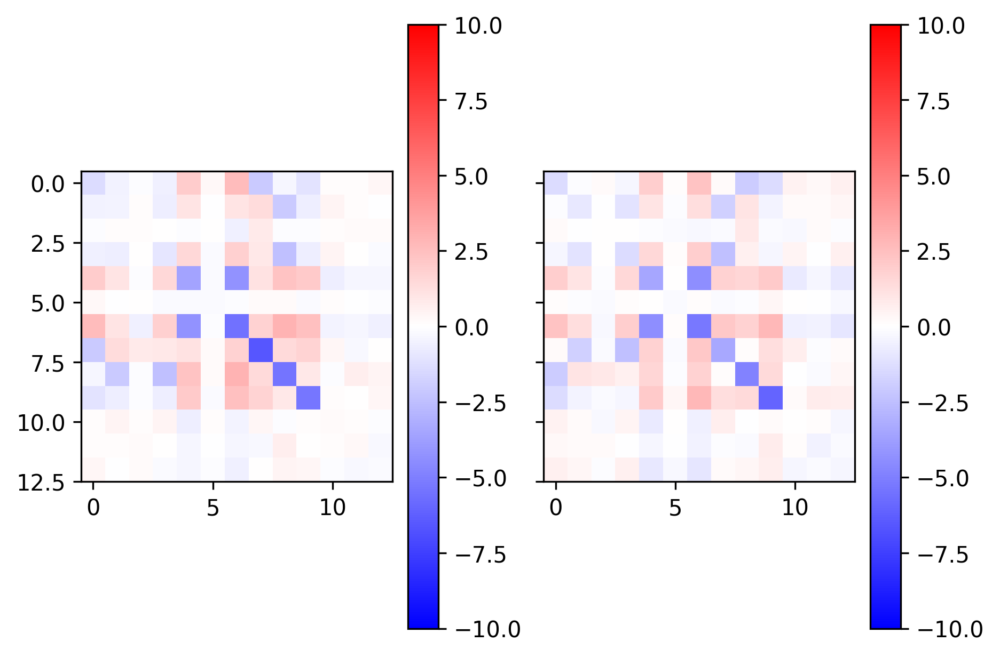

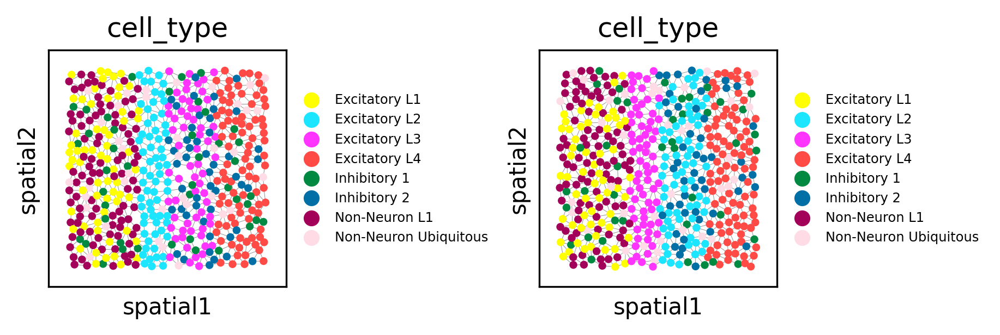

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 11	


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


normal
shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


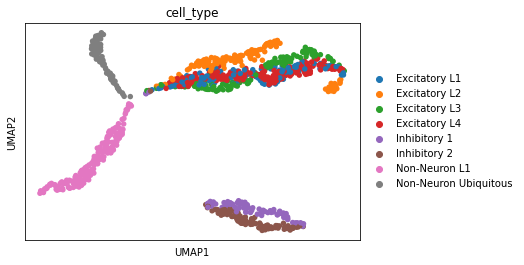

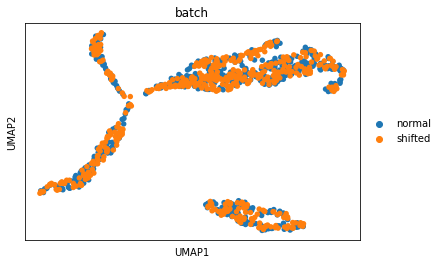

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


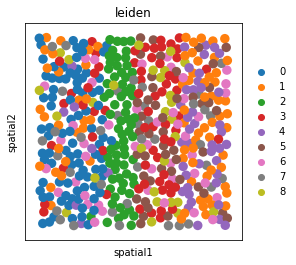

sklearn ARI: 0.7255495699739511


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


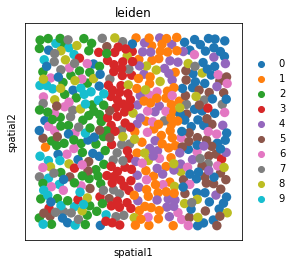

sklearn ARI: 0.6497103390740482


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

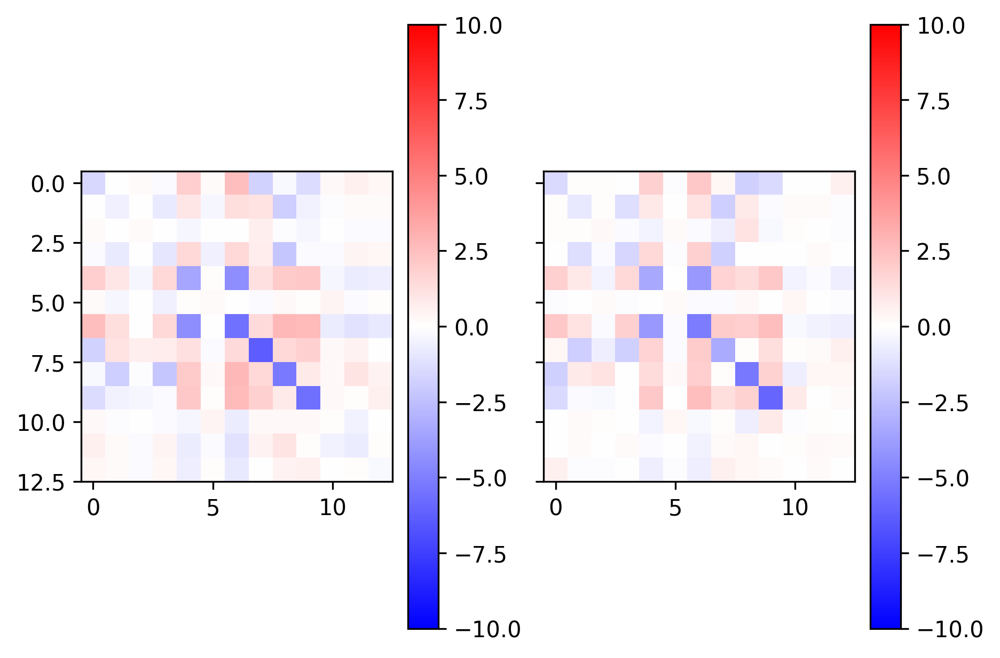

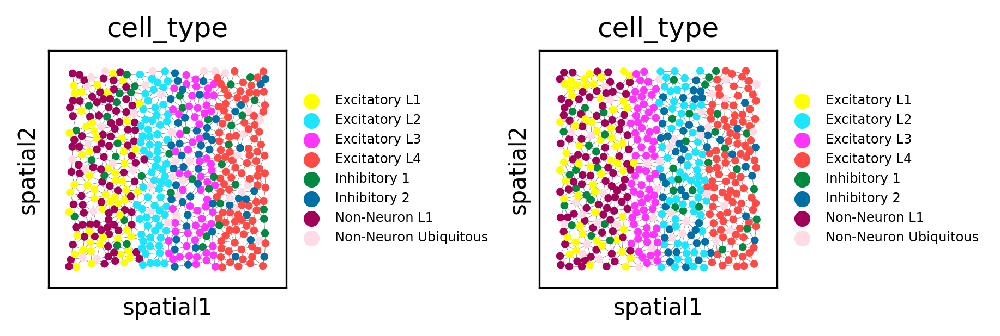

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 12	


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


normal
shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


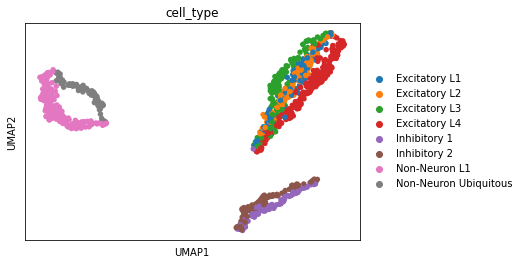

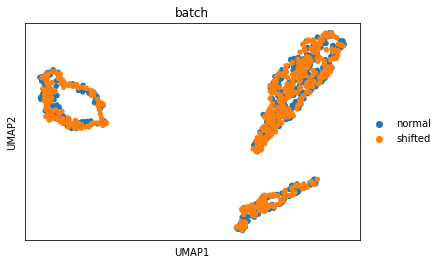

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


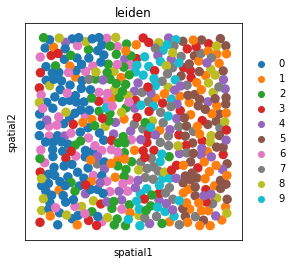

sklearn ARI: 0.5717377651034259


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


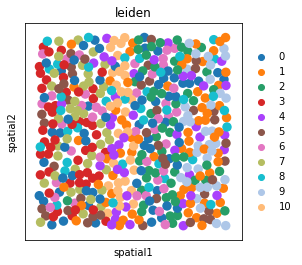

sklearn ARI: 0.5172528264500447


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

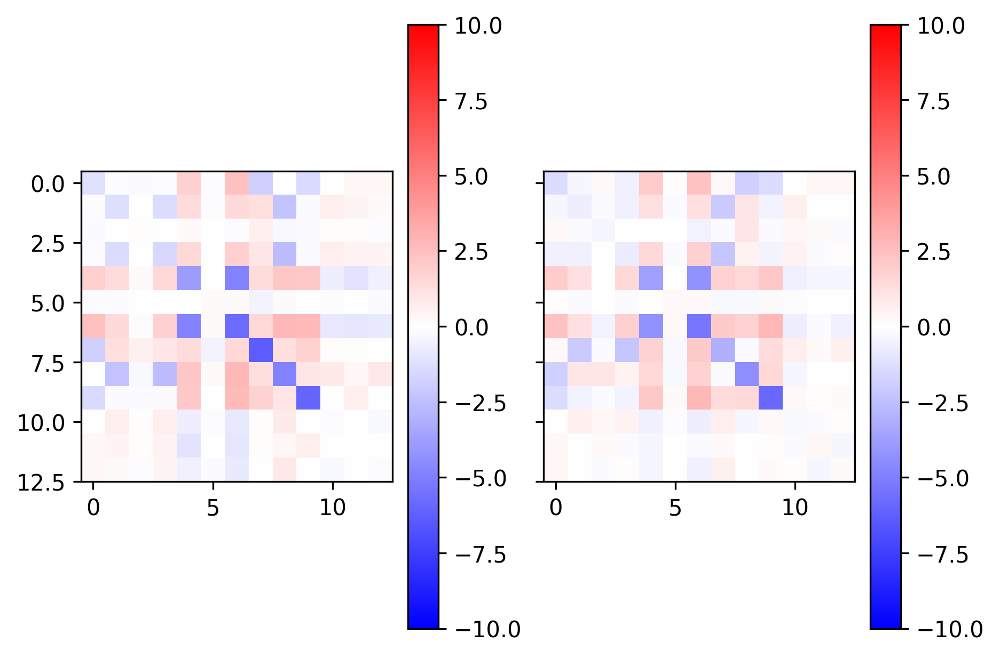

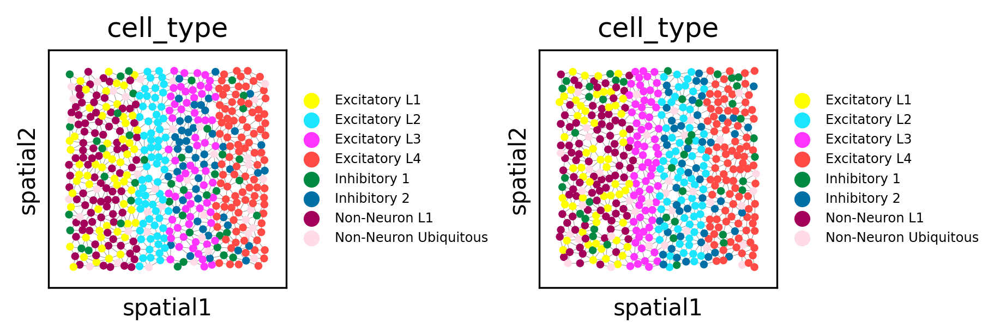

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 13	


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


normal
shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


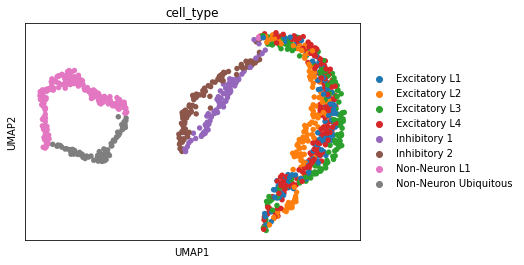

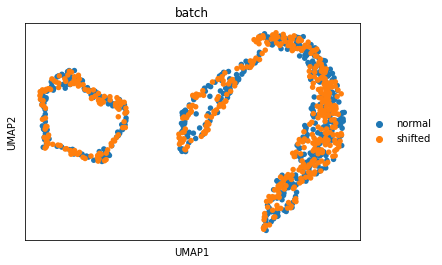

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


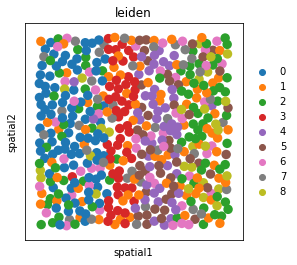

sklearn ARI: 0.6366654791580004


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


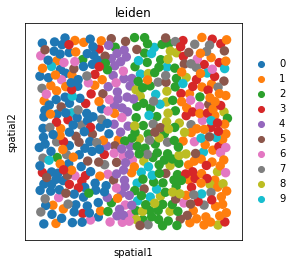

sklearn ARI: 0.6365220400000431


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

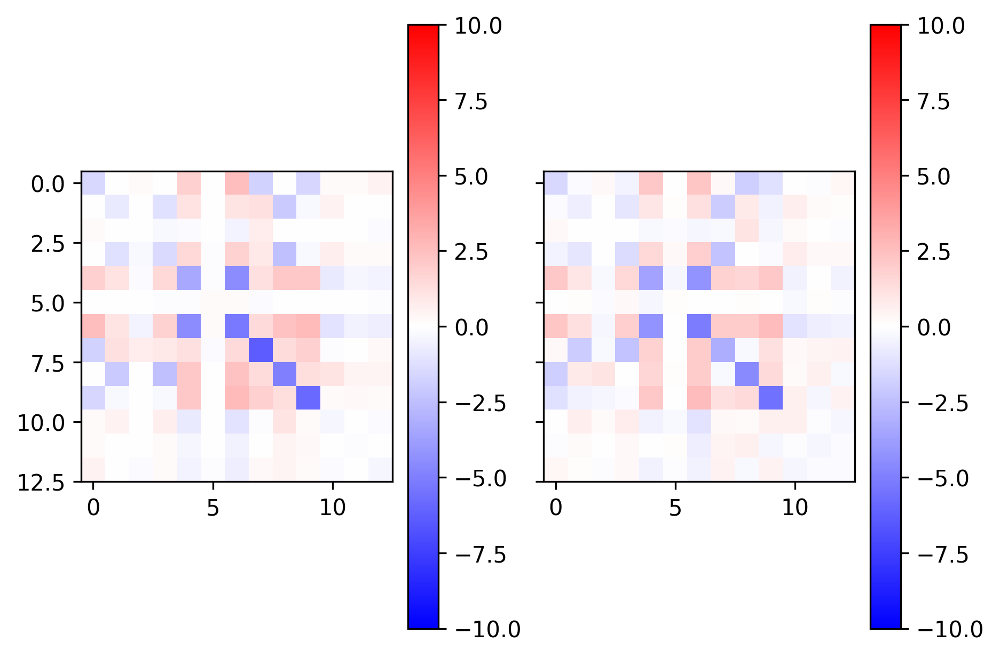

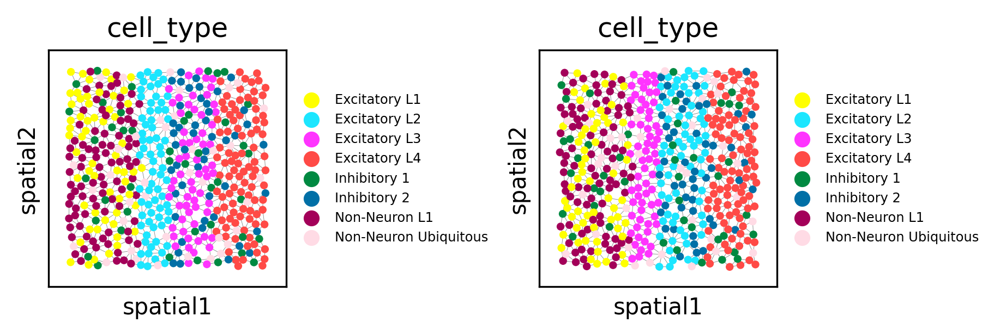

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 14	


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


normal
shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


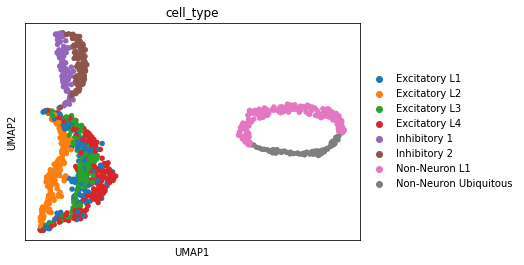

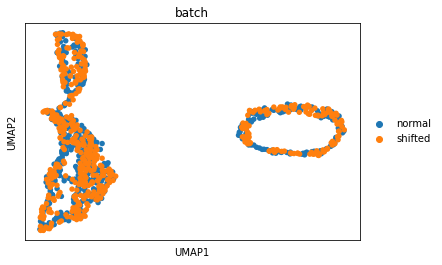

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


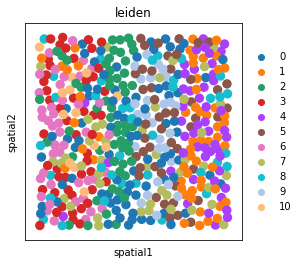

sklearn ARI: 0.5589082395059832


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


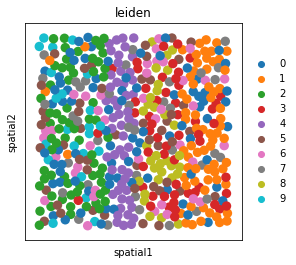

sklearn ARI: 0.6258752494697956


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

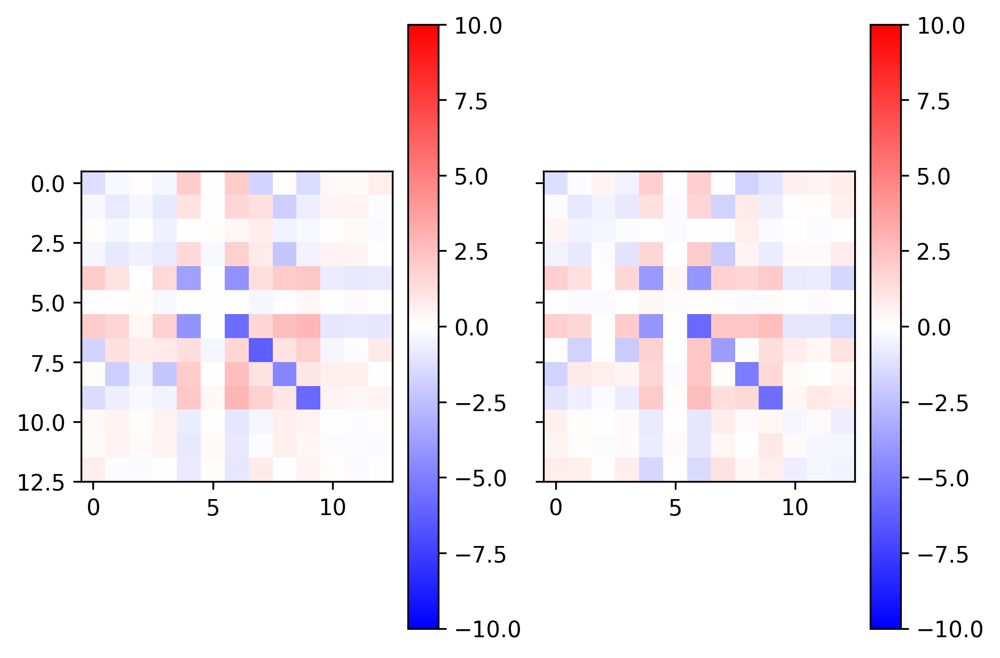

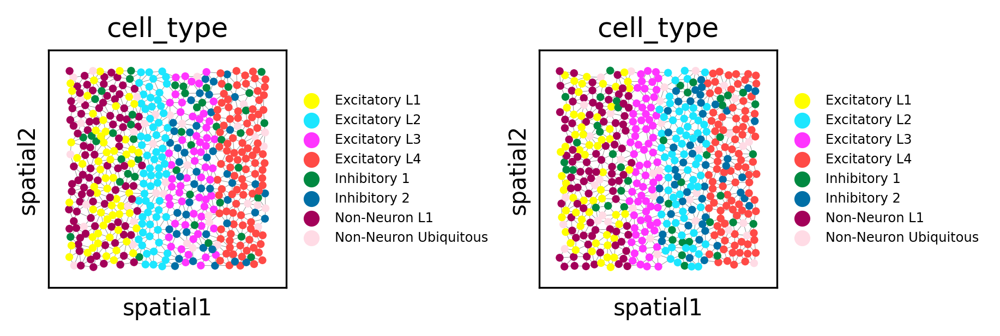

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 15	
normal


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


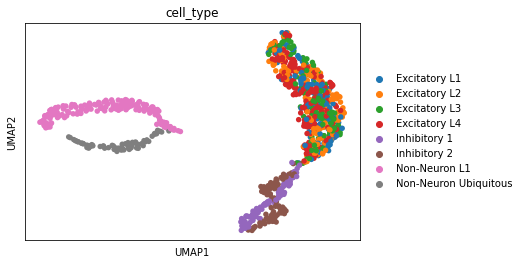

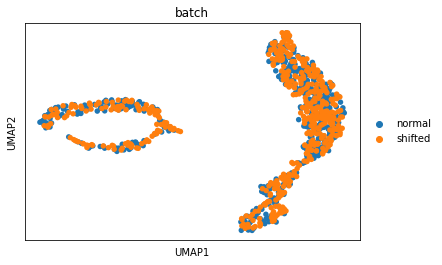

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


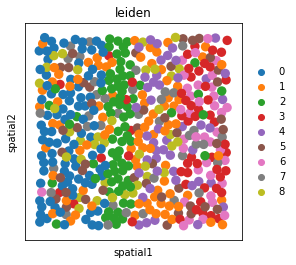

sklearn ARI: 0.6609108188373723


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


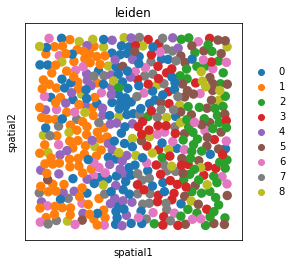

sklearn ARI: 0.6367856730952496


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

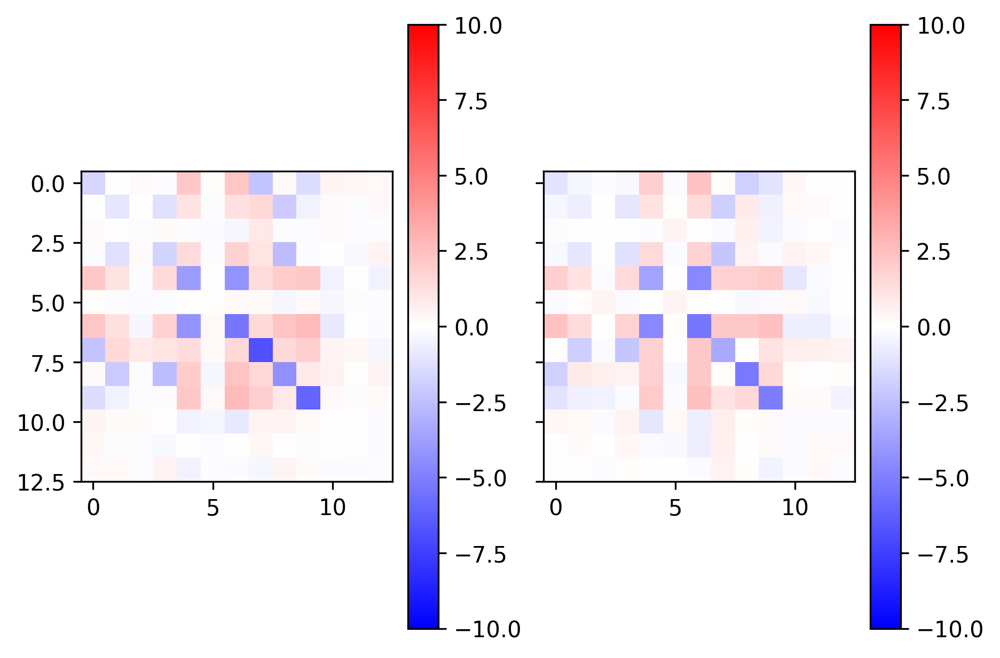

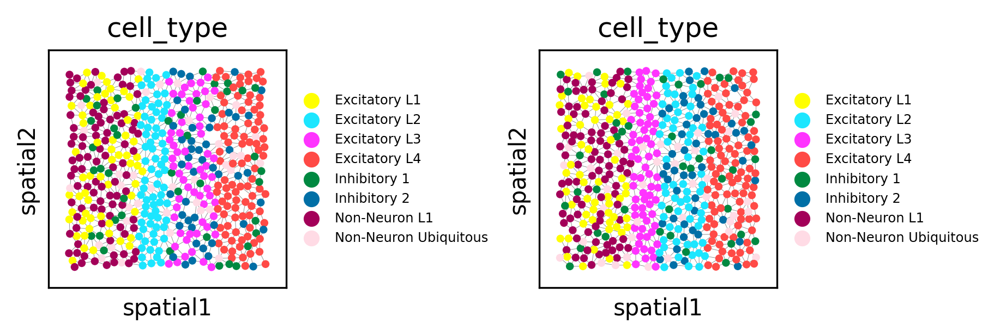

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 16	


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


normal
shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


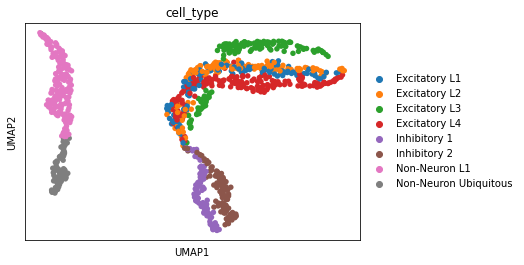

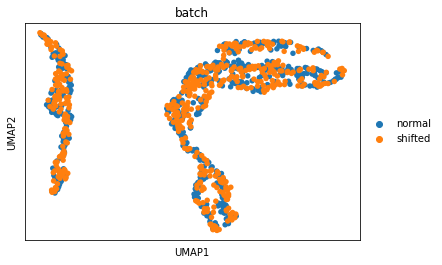

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


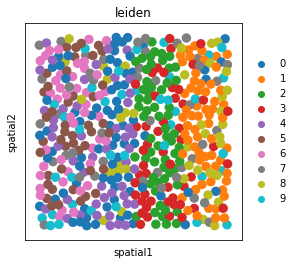

sklearn ARI: 0.6444012854277857


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


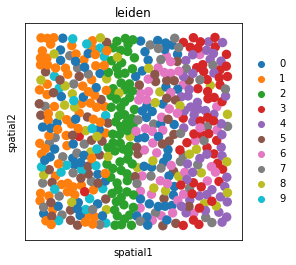

sklearn ARI: 0.7152667927287422


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

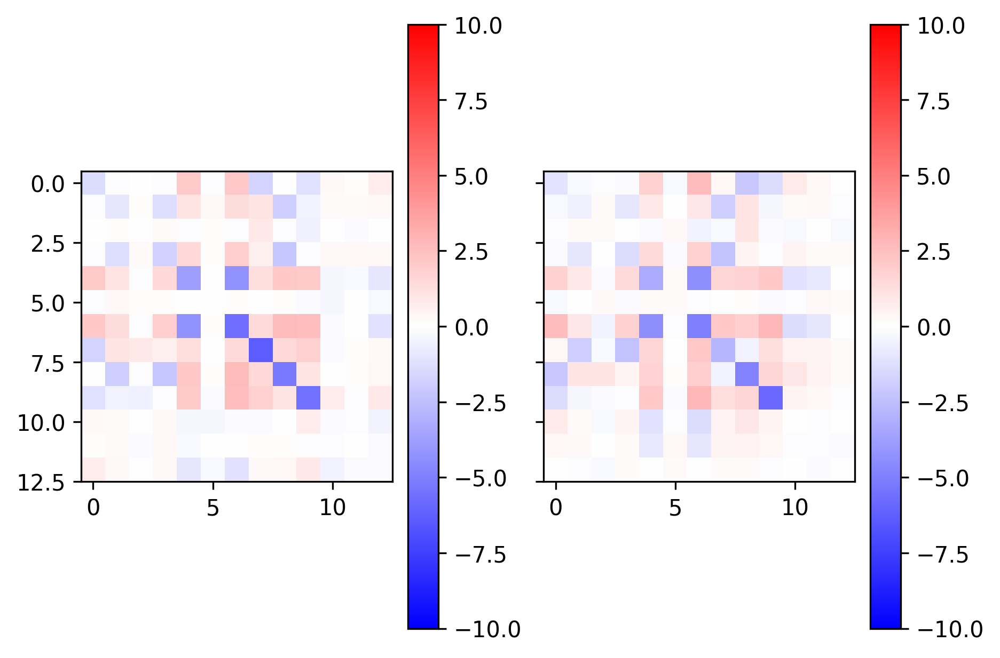

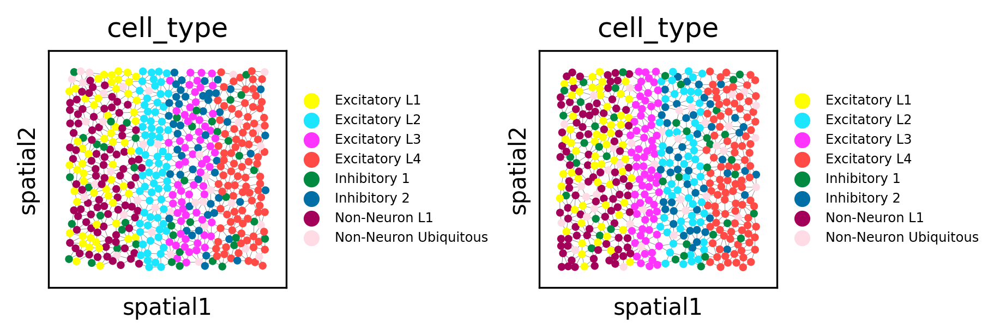

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 17	


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


normal
shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


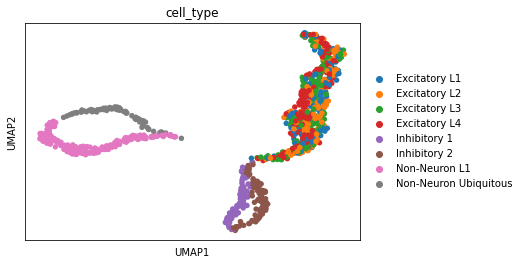

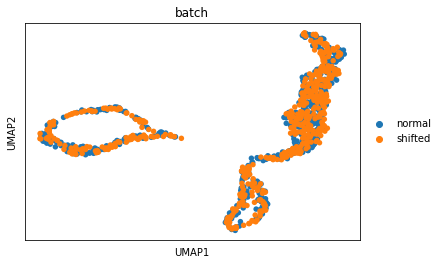

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


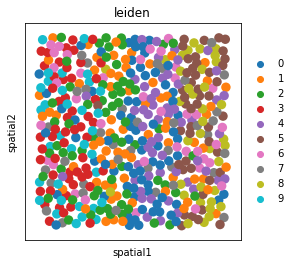

sklearn ARI: 0.49714381780374167


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


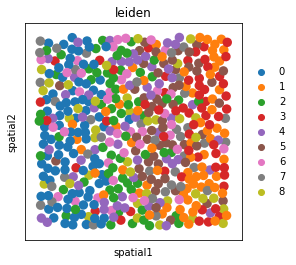

sklearn ARI: 0.5504320400396886


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

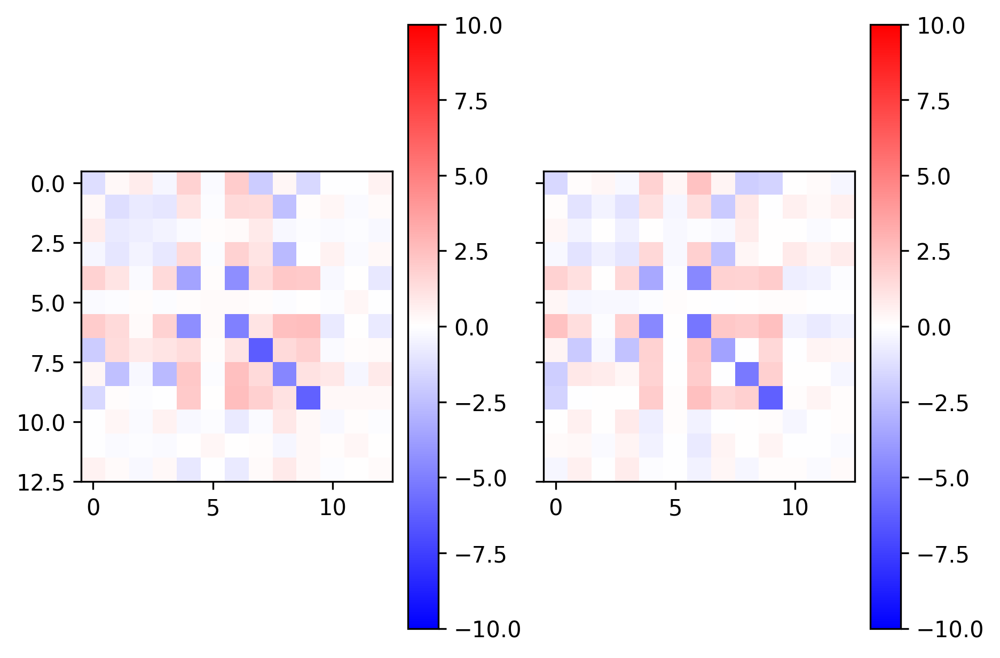

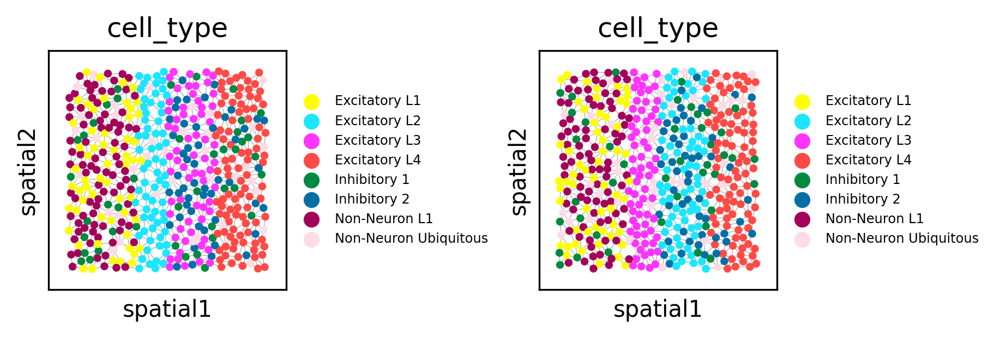

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 18	


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


normal
shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


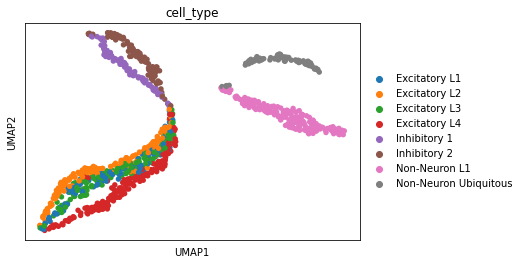

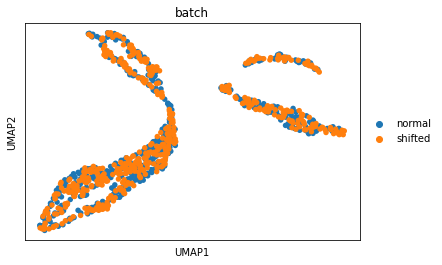

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


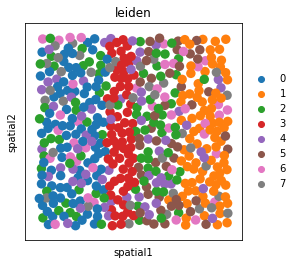

sklearn ARI: 0.7985377421168011


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


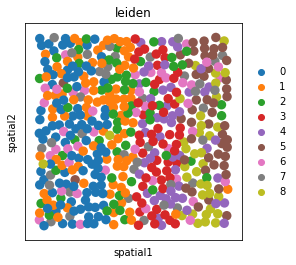

sklearn ARI: 0.7195364617318087


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

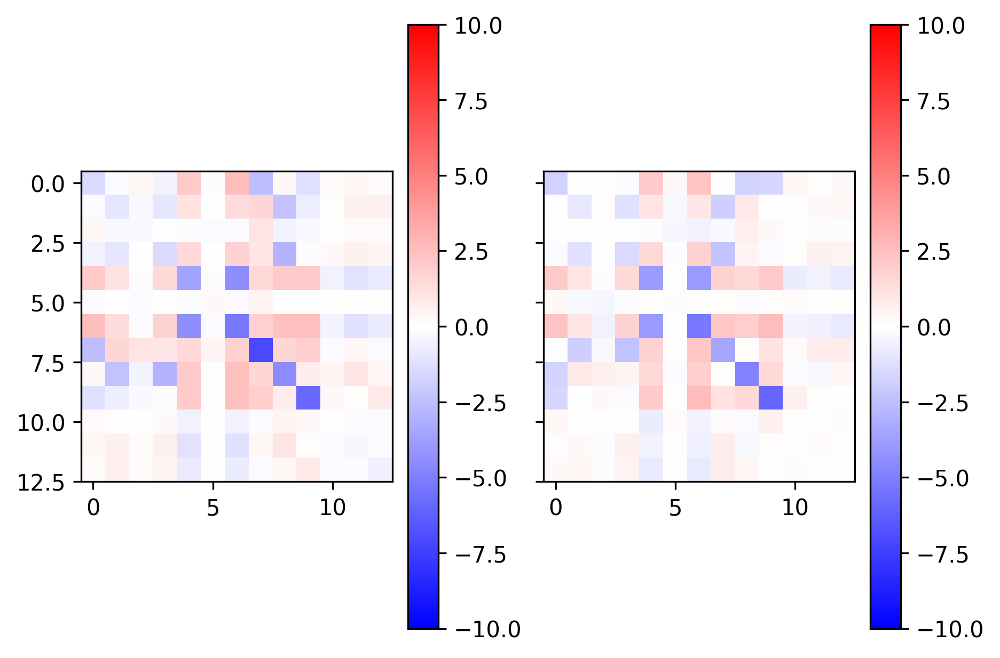

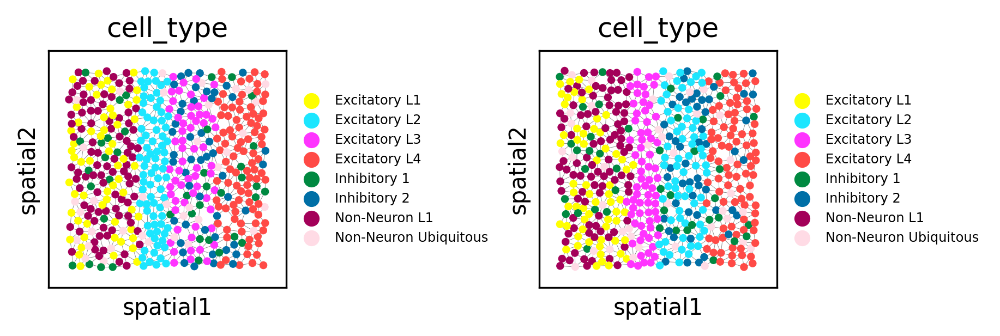

sigX_scale: 1.5	sigY_scale: 2.0	noise_metagene_parameter: 8.0	random_state: 19	


/tmp/ipykernel_150613/2968309480.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  ad.AnnData.__init__(self, X=dummy_expression)


normal
shifted
         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


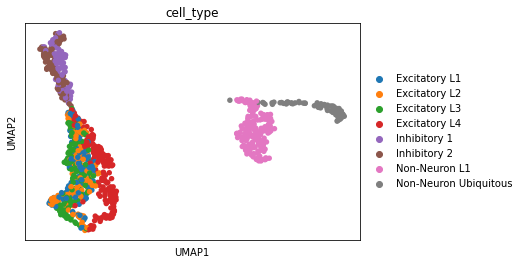

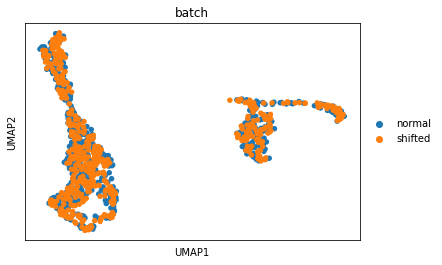

/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


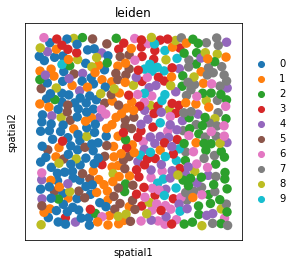

sklearn ARI: 0.5787770967342072


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1692: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(
/tmp/ipykernel_150613/759859083.py:9: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  sklearn_results = ad.AnnData(data.X)


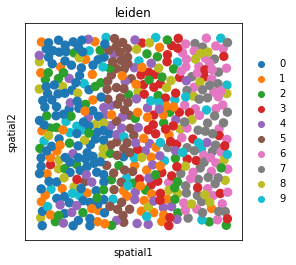

sklearn ARI: 0.6647069206626486


/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/spicemix/io.py:98: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  dataset_copy = ad.AnnData(
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/shahula/bin/miniconda3/envs/spicemix_distribution/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: Us

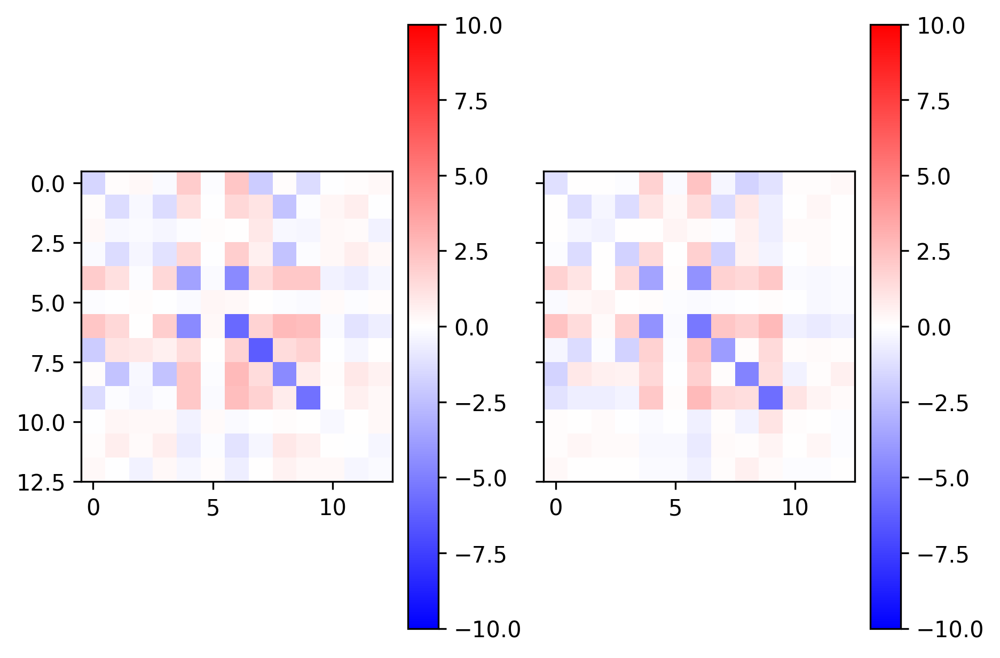

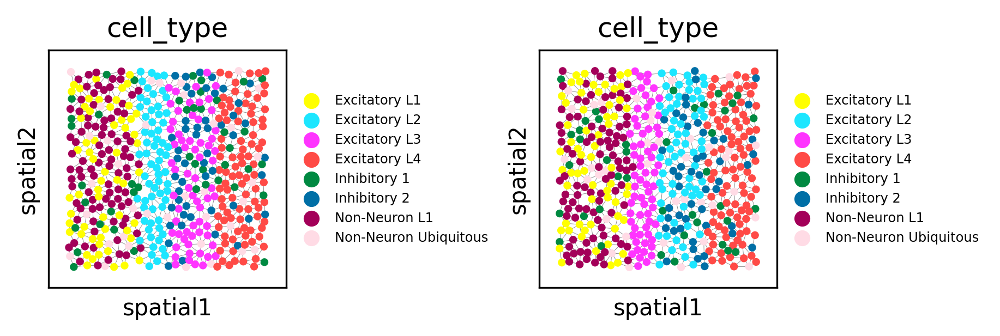

In [89]:
import itertools
root_path = Path("../../data/synthetic_cortex/multireplicate_shifted_excitatory_neurons/")

num_cells = 500
num_genes = 100

cell_type_definitions = {
    "Excitatory L1":         [1, 0, 0, 0, 0, 0, 0.6, 0, 0, 0],
    "Excitatory L2":         [1, 0, 0, 0, 0, 0, 0, 0.6, 0, 0],
    "Excitatory L3":         [1, 0, 0, 0, 0, 0, 0, 0, 0.6, 0],
    "Excitatory L4":         [1, 0, 0, 0, 0, 0, 0, 0, 0, 0.6],
    "Inhibitory 1":          [0, 1, 0.6, 0, 0, 0, 0, 0, 0.3, 0],
    "Inhibitory 2":          [0, 1, 0, 0.6, 0, 0, 0, 0, 0.3, 0],
    "Non-Neuron L1":         [0, 0, 0, 0, 1, 0, 0.3, 0, 0, 0],
    "Non-Neuron Ubiquitous": [0, 0, 0, 0, 0, 1, 0.3, 0, 0, 0],
}
layer_distributions = {
    "L1": {
        "Excitatory L1": 0.33,
        "Inhibitory 1": 0.1,
        "Non-Neuron L1": 0.5,
        "Non-Neuron Ubiquitous": 0.07
    },
    "L2": {
        "Excitatory L2": 0.93,
        "Non-Neuron Ubiquitous": 0.07
    },
    "L3": {
        "Excitatory L3": 0.53,
        "Inhibitory 1": 0.1,
        "Inhibitory 2": 0.3,
        "Non-Neuron Ubiquitous": 0.07
    },
    "L4": {
        "Excitatory L4": 0.73,
        "Inhibitory 1": 0.1,
        "Inhibitory 2": 0.1,
        "Non-Neuron Ubiquitous": 0.07
    },
}

shifted_distributions = {
    "L1": {
        "Excitatory L1": 0.33,
        "Inhibitory 1": 0.1,
        "Non-Neuron L1": 0.5,
        "Non-Neuron Ubiquitous": 0.07
    },
    "L2": {
        "Excitatory L3": 0.93,
        "Non-Neuron Ubiquitous": 0.07
    },
    "L3": {
        "Excitatory L2": 0.53,
        "Inhibitory 1": 0.1,
        "Inhibitory 2": 0.3,
        "Non-Neuron Ubiquitous": 0.07
    },
    "L4": {
        "Excitatory L4": 0.73,
        "Inhibitory 1": 0.1,
        "Inhibitory 2": 0.1,
        "Non-Neuron Ubiquitous": 0.07
    },
}

replicate_parameters = {
    "normal": {
        "distributions": layer_distributions,
        "cell_type_definitions": cell_type_definitions,
        "metagene_variation_probabilities": metagene_variation_probabilities
    },
    "shifted": {
        "distributions": shifted_distributions,
        "cell_type_definitions": cell_type_definitions,
        "metagene_variation_probabilities": metagene_variation_probabilities
    }
}

metagene_variation_probabilities = [0, 0.25, 0, 0.25, 0, 0.25, 0, 0.1, 0.1, 0.1]

sigX_scale_options = np.linspace(1.5, 1.5, 1)
sigY_scale_options = np.linspace(2.0, 2.0, 1)
noise_metagene_parameter_options = np.linspace(8.0, 8.0, 1)

options = itertools.product(sigX_scale_options, sigY_scale_options, noise_metagene_parameter_options, np.arange(20))
counter = 0
for sigX_scale, sigY_scale, noise_metagene_parameter, random_state in options:
    print(f"sigX_scale: {sigX_scale}\t"
          f"sigY_scale: {sigY_scale}\t"
          f"noise_metagene_parameter: {noise_metagene_parameter}\t"
          f"random_state: {random_state}\t"
    )
    
    simulation_parameters = {
        'num_real_metagenes': 10,
        'num_noise_metagenes': 3,
        'sigY_scale': sigY_scale,
        'sigX_scale': sigX_scale,
        "real_metagene_parameter": 4.0,
        "noise_metagene_parameter": noise_metagene_parameter,
        'lambda_s': 1.0,
    }
    
    replicate_simulation_parameters = {
        "normal": simulation_parameters,
        "shifted": simulation_parameters
    }

    run_path = root_path / f"synthetic_{num_cells}_{num_genes}_sigY-scale-{sigY_scale}_sigX-scale-{sigX_scale}_noise-metagene-parameter_{noise_metagene_parameter}" / f"random_state_{random_state}"
    run_path.mkdir(exist_ok=True, parents=True)
#     if (run_path/ "processed_dataset.h5ad").exists():
#         continue

    multireplicate_dataset = MultiReplicateSyntheticDataset(num_cells, num_genes, replicate_parameters, SyntheticDataset, random_state=random_state)
    
    multireplicate_dataset.datasets["normal"].domain_canvas.load_domains(annotated_domains)
    multireplicate_dataset.datasets["shifted"].domain_canvas.load_domains(annotated_domains)
    
    multireplicate_dataset.assign_layer_labels()
    multireplicate_dataset.simulate_expression(replicate_simulation_parameters)
    
    # Sanity check plot
    replicate_names, dataset_copies = zip(*multireplicate_dataset.datasets.items())
    merged_dataset = ad.concat(dataset_copies, label="batch", keys=replicate_names, merge="unique", uns_merge="unique", pairwise=True)                                                                                                                                        
    
    sc.pp.neighbors(merged_dataset)
    sc.tl.umap(merged_dataset)
    
    fig, ax = plt.subplots()
    sc.pl.umap(merged_dataset, color="cell_type", ax=ax)
    
    fig, ax = plt.subplots()
    sc.pl.umap(merged_dataset, color="batch", ax=ax)
    
    (replicate_names, datasets) = zip(*multireplicate_dataset.datasets.items())

    for dataset in datasets:
        sq.gr.spatial_neighbors(dataset, coord_type="generic", delaunay=True)
        dataset.obsp["spatial_connectivities"] = remove_connectivity_artifacts(dataset.obsp["spatial_distances"])
        dataset.obsp["adjacency_matrix"] = dataset.obsp["spatial_connectivities"]
        
        sklearn_results = train_sklearn_NMF(dataset, 10, random_state)
        report_sklearn_NMF(sklearn_results)

    save_anndata(run_path/ "processed_dataset.h5ad", datasets, replicate_names)
    
    # Initialize
    test = SpiceMixPlus(
        K=10,
        lambda_Sigma_x_inv=1e-4,
        dataset_path=run_path/"processed_dataset.h5ad",
        initialization_method="kmeans",
        verbose=0,
        prior_x_modes=None,
        random_state=0
    )
    
    compute_empirical_correlations(test, feature="ground_truth_X", output="ground_truth_empirical_correlation")                           
    multireplicate_heatmap(test, uns="ground_truth_empirical_correlation", aspect=1, cmap="bwr", vmin=-10, vmax=10)
    plt.show()
    
    plot_in_situ(test, color="cell_type")
    plt.show()